## BirdsEye results user guide

By default, experiment logs will be stored in the `./runs` directory. 

Depending on the motion planning method used, the logs will be separated into subdirectories `./runs/mcts` and `./runs/dqn`

Every experiment will have 2 log files associated with it.  
They are saved in the format `%Y-%m-%dT%H:%M:%S_header.txt` and `%Y-%m-%dT%H:%M:%S_data.csv` where `%Y-%m-%dT%H:%M:%S` is a timestamp denoting when the experiment was started.

The `%Y-%m-%dT%H:%M:%S_header.txt` files contain a dictionary of the settings used to run the experiment. 

The `%Y-%m-%dT%H:%M:%S_data.csv` files contain a table of metrics, and state information saved from the experiment.

In [3]:
import matplotlib.pyplot as plt
import pprint
from birdseye.results import * 
from datetime import datetime
import itertools

To easily view the results from specific experiments we have written the `filter_runs(method, filter)` function, which accepts a a motion planning method and a dictionary.  
The dictionary is used to filter experiments by specific config settings.  
For instance you can filter by `datetime_start`, `datetime_end`, `reward`, `sensor` and others.

The `filter_runs()` function will return a list of experiment names (starting timestamp) which can then be used to access the specific experiment config (using `get_config(method, run)`) and log data (using `get_data(method, run)`).

In [93]:

def experiments_status(): 
    # sensor (doublerssi)
    # method type (dqn, mcts)
    # reward (range_reward, entropy_collision_reward)
    # fading_sigma (0,2,4)
    # resample_proportion (0.005, 0.01)
    
    sensors = ['doublerssi']
    methods = ['mcts','dqn','baseline']
    rewards = ['range_reward','entropy_collision_reward','heuristic_reward']
    fading_sigmas = [8]
    particle_resample_rates = [0.01]

    experiment_list = list(itertools.product(sensors, methods, rewards, fading_sigmas, particle_resample_rates))
    for exp in experiment_list: 
        #run_filter = {'particle_diffuse':'True', 'version':'final'}
        run_filter['sensor'] = exp[0]
        run_filter['reward'] = exp[2]
        run_filter['fading_sigma'] = exp[3]
        run_filter['particle_resample'] = exp[4]
        runs = filter_runs(exp[1], run_filter)
        runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
        
        
        print('method = {}'.format(exp[1]))
        print('reward = {}'.format(run_filter['reward']))
        print('fading_simga = {}'.format(run_filter['fading_sigma']))
        print('particle_resample = {}'.format(run_filter['particle_resample']))
        
        if len(runs) > 0: 
            print('# runs = ',len(runs))
            print(runs[0])
            #print(get_config(exp[1], runs[0]))
        else: 
            print('MISSING EXPERIMENT!!!')
        print('========================')
experiments_status()

method = mcts
reward = range_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:26:38
method = mcts
reward = entropy_collision_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:28:09
method = mcts
reward = heuristic_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:29:49
method = dqn
reward = range_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:27:47
method = dqn
reward = entropy_collision_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:29:04
method = dqn
reward = heuristic_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:30:06
method = baseline
reward = range_reward
fading_simga = 8
particle_resample = 0.01
# runs =  1
2022-04-20T12:27:29
method = baseline
reward = entropy_collision_reward
fading_simga = 8
particle_resample = 0.01
MISSING EXPERIMENT!!!
method = baseline
reward = heuristic_reward
fading_simga = 8
particle_resample = 

In [80]:
def doublerssi_std_dev(run_filter): 
    
    mcts_runs = filter_runs('mcts', run_filter)
    mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
    

    mcts_data = get_data('mcts', mcts_runs[0])


    #assert mcts_data.shape[0] == dqn_data.shape[0]
    mcts_std_dev_r, mcts_std_dev_theta = mean_std_dev(mcts_data['pf_cov'])
    

    fig, (ax1,ax2) = plt.subplots(2,1, sharex=True)
    ax1.plot(mcts_std_dev_r, color='blue', marker='x', markevery=10, label='MCTS')
    #ax1.set_xlabel('timestep')
    ax1.set_ylabel(r'$\sigma_r$')
    ax1.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax1.grid( linestyle = '--', linewidth = 1)
    
    #fig, ax = plt.subplots(122)
    ax2.plot(mcts_std_dev_theta, color='blue', marker='x', markevery=10, label='MCTS')
    ax2.set_xlabel('timestep')
    ax2.set_ylabel(r'$\sigma_{{\theta}}$')
    ax2.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax2.grid( linestyle = '--', linewidth = 1)
    
def mean_std_dev(data): 

    cov = []
    for n in range(data.shape[0]): 
        cov.append(np.array(eval(data[n])))
    cov = np.array(cov)
    cov = cov.reshape(cov.shape[0], cov.shape[1], 8, 8)
    
    mean_cov = np.mean(cov, axis=0)
    
    std_dev_r = np.sqrt((mean_cov[:,0,0]+mean_cov[:,4,4])/2)
    std_dev_theta = np.sqrt((mean_cov[:,1,1]+mean_cov[:,5,5])/2)
    
    return std_dev_r, std_dev_theta

def doublerssi_std_dev_comparison(run_filter): 
    
    mcts_runs = filter_runs('mcts', run_filter)
    mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
    dqn_runs = filter_runs('dqn', run_filter)
    dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)

    mcts_data = get_data('mcts', mcts_runs[0])
    dqn_data = get_data('dqn', dqn_runs[0])


    #assert mcts_data.shape[0] == dqn_data.shape[0]
    mcts_std_dev_r, mcts_std_dev_theta = mean_std_dev(mcts_data['pf_cov'])
    dqn_std_dev_r, dqn_std_dev_theta = mean_std_dev(dqn_data['pf_cov'])
    

    fig, (ax1,ax2) = plt.subplots(2,1, figsize=(6,6), dpi=300, sharex=True)
    ax1.plot(mcts_std_dev_r, color='blue', marker='x', linestyle='--', markevery=10, label='MCTS')
    ax1.plot(dqn_std_dev_r, color='green', marker='D', markevery=10, label='DQN')
    #ax1.set_xlabel('timestep')
    ax1.set_ylabel(r'$\sigma_d$')
    #ax1.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax1.grid( linestyle = '--', linewidth = 1)
    
    #fig, ax = plt.subplots(122)
    ax2.plot(mcts_std_dev_theta, color='blue', marker='x', linestyle='--', markevery=10, label='MCTS')
    ax2.plot(dqn_std_dev_theta, color='green', marker='D', markevery=10, label='DQN')
    ax2.set_xlabel('Timestep (s)')
    ax2.set_ylabel(r'$\sigma_{{\theta}}$')
    #ax2.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax2.grid( linestyle = '--', linewidth = 1)
    ax2.legend(loc='center left', bbox_to_anchor=(1.0,1.1), fancybox=True, shadow=True,)
    #fig.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)

def doublerssi_std_dev_reward_comparison(run_filter): 
    baseline_filter = run_filter.copy()
    baseline_filter.pop('reward', None)
    baseline_policies = ['random', 'static'] # static
    baseline_datas = {}
    for policy in baseline_policies:
        baseline_filter['policy'] = policy
        baseline_runs = filter_runs('baseline', baseline_filter)
        if len(baseline_runs) > 0: 
            baseline_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            baseline_data = get_data('baseline', baseline_runs[0])
            print(baseline_runs[0])
            baseline_std_dev_r, baseline_std_dev_theta = mean_std_dev(baseline_data['pf_cov'])
            baseline_datas[policy] = [baseline_std_dev_r, baseline_std_dev_theta]

    
    mcts_datas = {}
    dqn_datas = {}
    rewards = ['entropy_collision_reward', 'range_reward', 'heuristic_reward']
    for reward in rewards: 
        run_filter['reward'] = reward
        
        mcts_runs = filter_runs('mcts', run_filter)
        if len(mcts_runs) > 0: 
            mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            mcts_data = get_data('mcts', mcts_runs[0])
            print(mcts_runs[0])
            mcts_std_dev_r, mcts_std_dev_theta = mean_std_dev(mcts_data['pf_cov'])
            mcts_datas[reward] = [mcts_std_dev_r,mcts_std_dev_theta]

        dqn_runs = filter_runs('dqn', run_filter)
        if len(dqn_runs) > 0: 
            dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            dqn_data = get_data('dqn', dqn_runs[0])
            print('dqn, rew = {}, {}'.format(reward,dqn_runs[0]))
            dqn_std_dev_r, dqn_std_dev_theta = mean_std_dev(dqn_data['pf_cov'])
            dqn_datas[reward] = [dqn_std_dev_r, dqn_std_dev_theta]
            #assert mcts_data.shape[0] == dqn_data.shape[0]

        
    ###

    fig, (ax1,ax2) = plt.subplots(2,1, figsize=(6,8), dpi=300, sharex=True)
    ax1.set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    ax2.set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])

    policy_label = {'random':'Random', 'static':'Stationary'}

    for i,policy in enumerate(baseline_policies): 
        if policy in baseline_datas: 
            ax1.plot(baseline_datas[policy][0], marker='.', linestyle='-', markevery=10, label=policy_label[policy])
            ax2.plot(baseline_datas[policy][1], marker='o', linestyle='-', markevery=10, label=policy_label[policy])

    reward_label = {'entropy_collision_reward':'entropy', 'range_reward':'state heuristic', 'heuristic_reward':'belief heuristic'}
    

    for i,reward in enumerate(rewards):  
        if reward in mcts_datas: 
            ax1.plot(mcts_datas[reward][0], marker='x', linestyle='-', markevery=10, label='$MCTS, r_{{{}}}$'.format(reward_label[reward]))
    for i,reward in enumerate(rewards): 
        if reward in mcts_datas: 
            ax2.plot(mcts_datas[reward][1], marker='x', linestyle='-', markevery=10, label='$MCTS, r_{{{}}}$'.format(reward_label[reward]))

    for i,reward in enumerate(rewards):     
        if reward in dqn_datas: 
            ax1.plot(dqn_datas[reward][0], marker='D', markevery=10, label='$DQN, r_{{{}}}$'.format(reward_label[reward]))
    for i,reward in enumerate(rewards): 
        if reward in dqn_datas: 
            ax2.plot(dqn_datas[reward][1], marker='D', markevery=10, label='$DQN, r_{{{}}}$'.format(reward_label[reward]))

    #ax1.set_xlabel('timestep')
    ax1.set_ylabel(r'$\sigma_d$', fontsize=12)
    #ax1.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax1.grid( linestyle = '--', linewidth = 1)
    ax2.set_xlabel('Timestep (s)')
    ax2.set_ylabel(r'$\sigma_{{\theta}}$', fontsize=12)
    #ax2.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax2.grid( linestyle = '--', linewidth = 1)
    #ax2.legend(loc='center left', bbox_to_anchor=(1.0,1.1), fancybox=True, shadow=True,)
    ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=3)
    #fig.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)

2022-04-20T12:27:29
2022-04-20T12:28:09
dqn, rew = entropy_collision_reward, 2022-04-20T12:29:04
2022-04-20T12:26:38
dqn, rew = range_reward, 2022-04-20T12:27:47
2022-04-20T12:29:49
dqn, rew = heuristic_reward, 2022-04-20T12:30:06


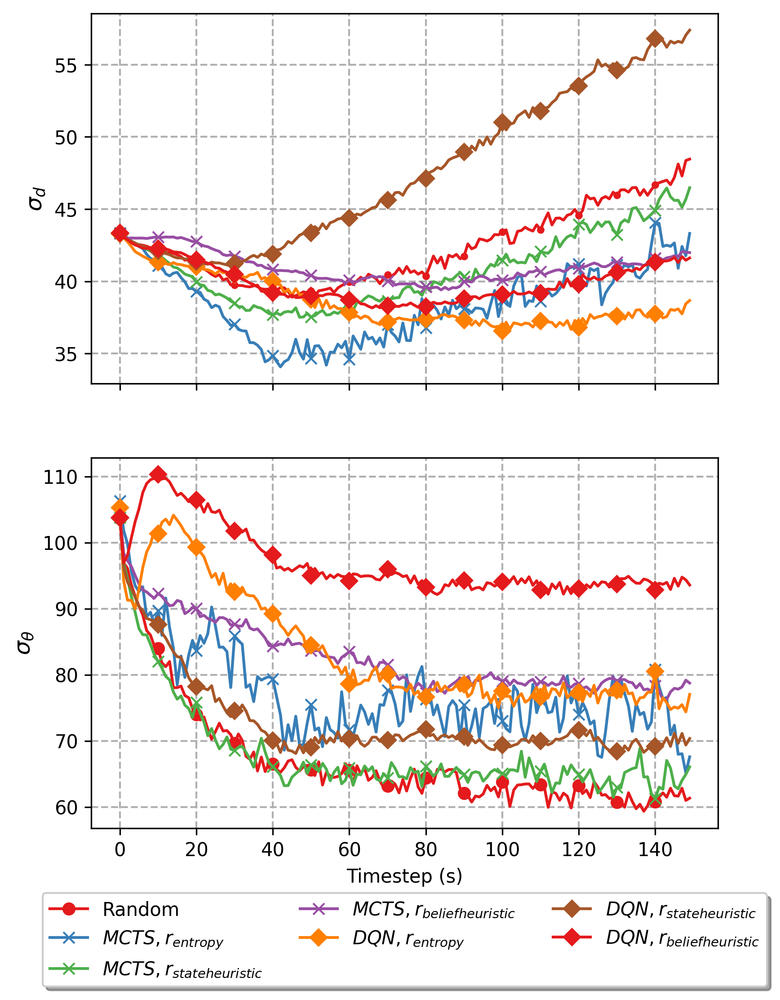

In [90]:
run_filter = {'sensor': 'doublerssi',  'fading_sigma':8}
doublerssi_std_dev_reward_comparison(run_filter)

2022-04-18T12:18:55
2022-04-18T12:20:21
dqn, rew = entropy_collision_reward, 2022-04-18T12:20:39
2022-04-18T12:21:35
dqn, rew = range_reward, 2022-04-18T12:21:55
2022-04-18T12:23:38
dqn, rew = heuristic_reward, 2022-04-18T12:24:01


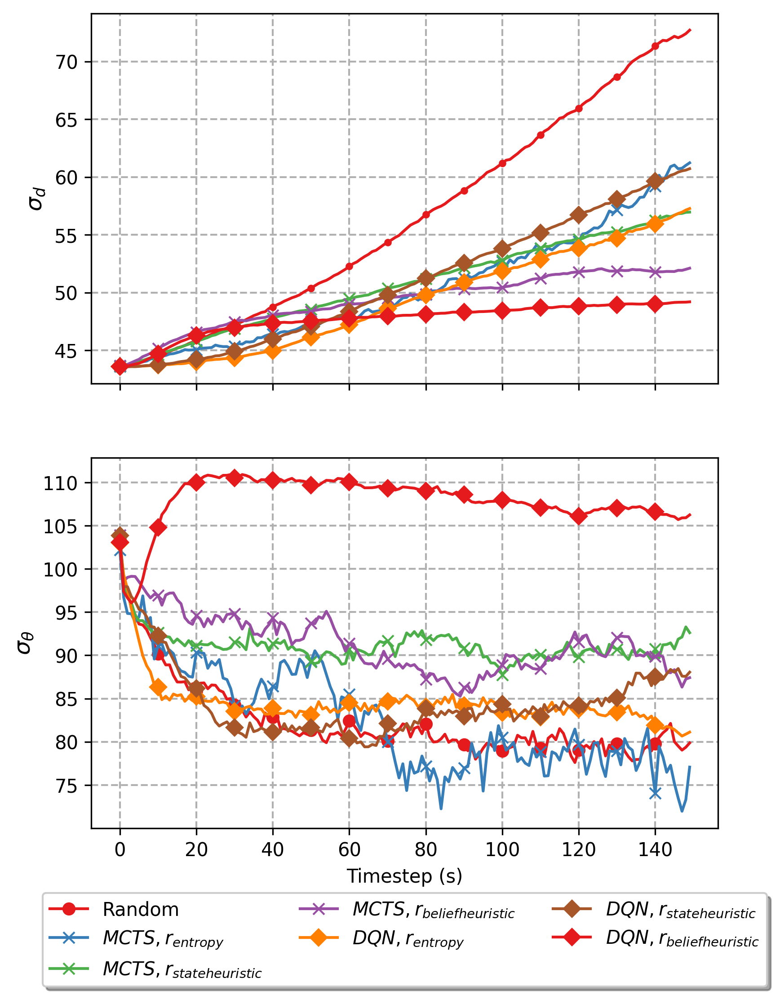

In [81]:
run_filter = {'sensor': 'doublerssilofi',  'fading_sigma':8 , 'likelihood':'weight2'}
doublerssi_std_dev_reward_comparison(run_filter)

2022-04-06T11:24:23
2022-04-06T11:23:56
2022-04-06T10:57:39
2022-04-06T10:55:58
2022-04-06T10:52:34
2022-04-06T11:22:19
2022-04-06T16:11:17
2022-04-06T16:12:48


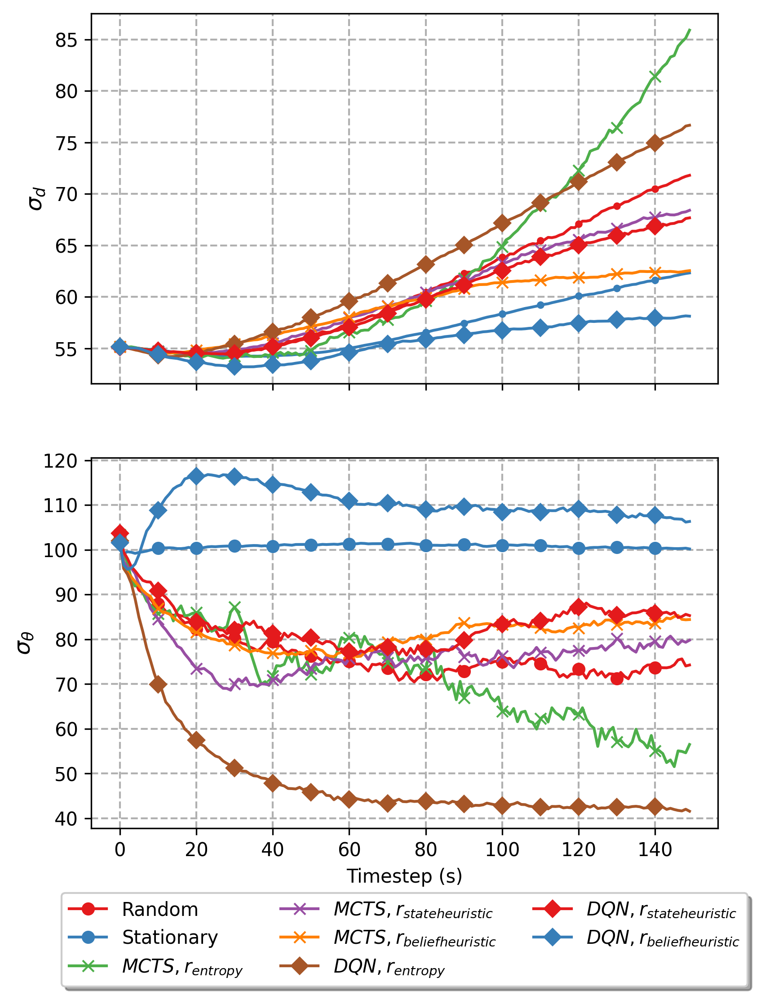

In [47]:
run_filter = {'sensor': 'doublerssilofi',  'fading_sigma':8 , 'particle_diffuse':None}
doublerssi_std_dev_reward_comparison(run_filter)

2022-04-08T15:48:01
2022-04-08T15:48:19
2022-04-08T15:49:10
dqn, rew = entropy_collision_reward, 2022-04-09T09:49:40
2022-04-09T09:50:33
dqn, rew = range_reward, 2022-04-09T09:51:12
2022-04-09T09:53:34
dqn, rew = heuristic_reward, 2022-04-09T09:53:10


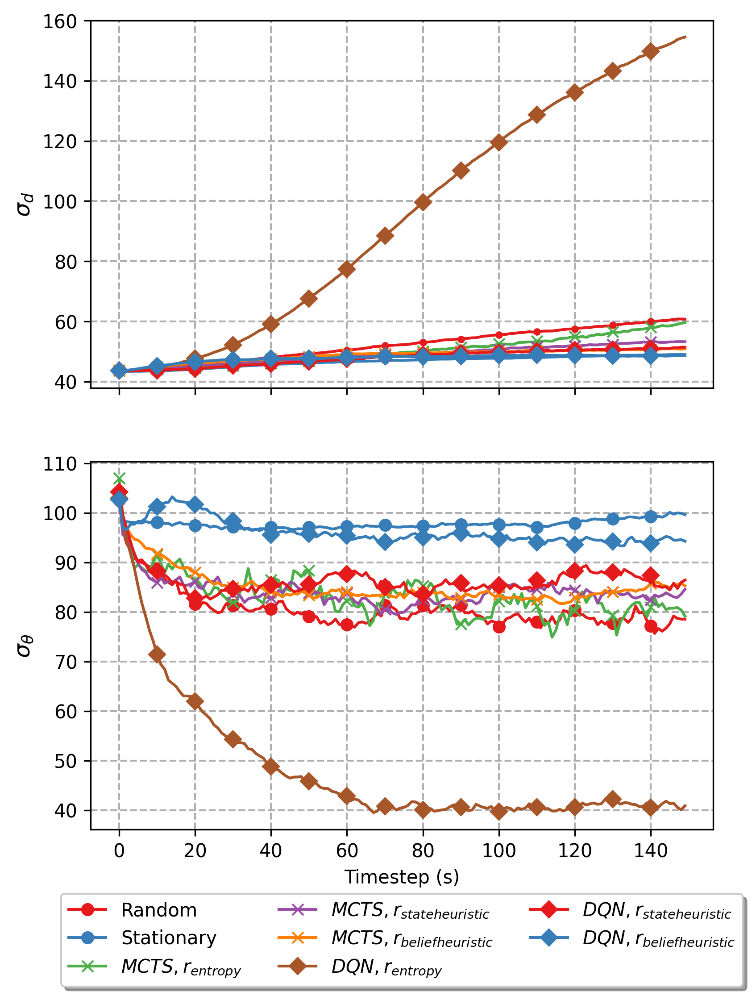

In [55]:
run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':8 , 'particle_diffuse':'True', 'version':'final_weight'}
doublerssi_std_dev_reward_comparison(run_filter)

2022-04-08T15:48:01
2022-04-08T15:48:19
2022-04-08T15:49:10
2022-04-09T09:49:40
2022-04-09T09:50:33
2022-04-09T09:51:12
2022-04-09T09:53:34
2022-04-09T09:53:10


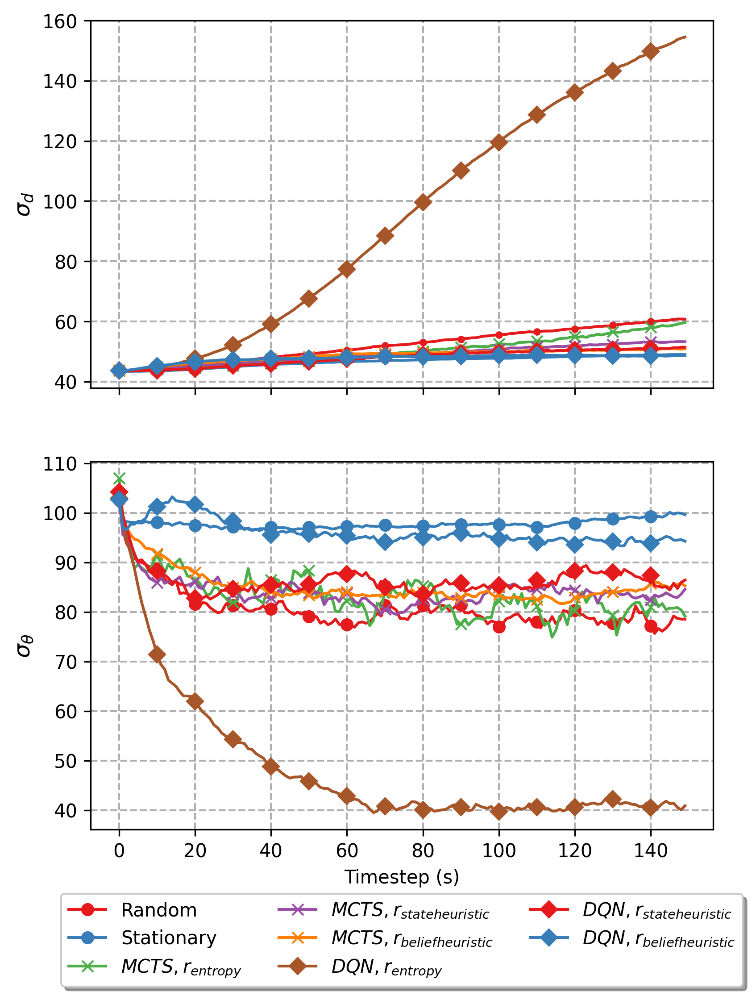

In [53]:
### FIGURE
run_filter = {'sensor': 'doublerssilofi',  'fading_sigma':8 }

doublerssi_std_dev_reward_comparison(run_filter)

In [88]:
def mean_metric(data): 
    n_runs = data.shape[0]
    
    mean_metric = []
    for n in range(n_runs): 
        a = re.split(',', re.sub('[\n]+', ',', data[n]))
        b = [re.sub('[\[\]]+', '', aa).strip() for aa in a]
        c = [re.split('\s+', bb) for bb in b ]
        d = [[float(ccc) for ccc in cc] for cc in c]
        d = np.mean(d, axis=1)
        mean_metric.append(d)
    mean_metric = np.array(mean_metric)
    mean_metric = np.mean(mean_metric, axis=0)    
    return mean_metric

def doublerssi_mean_metric_comparison(run_filter, metric): 
    
    mcts_runs = filter_runs('mcts', run_filter)
    mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
    dqn_runs = filter_runs('dqn', run_filter)
    dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)

    mcts_data = get_data('mcts', mcts_runs[0])
    dqn_data = get_data('dqn', dqn_runs[0])


    #assert mcts_data.shape[0] == dqn_data.shape[0]
    
    mcts_mean = mean_metric(mcts_data[metric])
    dqn_mean = mean_metric(dqn_data[metric])
    

    fig, ax = plt.subplots()
    ax.plot(mcts_mean, color='blue', marker='x', markevery=10, label='MCTS')
    ax.plot(dqn_mean, color='green', marker='D', markevery=10, label='DQN')
    ax.set_xlabel('timestep')
    ax.set_ylabel(metric)
    ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax.grid( linestyle = '--', linewidth = 1)
    
    
def doublerssi_mean_metric_sigma(run_filter, metric, sigmas): 
    
    mcts_datas = []
    dqn_datas = []
    for sigma in sigmas: 
        run_filter['fading_sigma'] = sigma
        
        mcts_runs = filter_runs('mcts', run_filter)
        mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
        
        mcts_data = get_data('mcts', mcts_runs[0])
        

        #assert mcts_data.shape[0] == dqn_data.shape[0]

        mcts_mean = mean_metric(mcts_data[metric])
        
        
        mcts_datas.append(mcts_mean)
        
    

    fig, ax = plt.subplots()
    
    for i,sigma in enumerate(sigmas): 
        ax.plot(mcts_datas[i], marker='x', markevery=10, label=r'$MCTS, \sigma={}$'.format(sigma))
    
   
    
    ax.set_xlabel('timestep')
    ax.set_ylabel(metric)
    
    ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax.grid( linestyle = '--', linewidth = 1)
    
def doublerssi_mean_metric_sigma_comparison(run_filter, metric, sigmas): 
    
    baseline_datas = {}
    mcts_datas = {}
    dqn_datas = {}
    for sigma in sigmas: 
        run_filter['fading_sigma'] = sigma
        
        baseline_filter = run_filter.copy()
        baseline_filter.pop('reward',None)
        baseline_policies = ['random', 'static']
        baseline_datas[sigma] = {}
        for policy in baseline_policies: 
            baseline_filter['policy'] = policy
            baseline_runs = filter_runs('baseline', baseline_filter)
            
            if len(baseline_runs) > 0: 
                baseline_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
                baseline_data = get_data('baseline', baseline_runs[0])
                baseline_mean = mean_metric(baseline_data[metric])
                
                baseline_datas[sigma][policy] = baseline_mean
        
        mcts_runs = filter_runs('mcts', run_filter)
        if len(mcts_runs) > 0: 
            mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            mcts_data = get_data('mcts', mcts_runs[0])
            print(mcts_runs[0])
            mcts_mean = mean_metric(mcts_data[metric])
            mcts_datas[sigma] = mcts_mean

        dqn_runs = filter_runs('dqn', run_filter)
        if len(dqn_runs) > 0: 
            dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            dqn_data = get_data('dqn', dqn_runs[0])
            print(dqn_runs[0])
            dqn_mean = mean_metric(dqn_data[metric])
            dqn_datas[sigma] = dqn_mean

    

    fig, ax = plt.subplots(figsize=(6,4), dpi=300)
    ax.set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    for i,policy in enumerate(baseline_policies): 
        for j,sigma in enumerate(sigmas): 
            if sigma in baseline_datas: 
                if policy in baseline_datas[sigma]: 
                    print(policy,sigma)
                    ax.plot(baseline_datas[sigma][policy], marker='x', markevery=20, linestyle='--', label=r'${}, \sigma_{{fading}}={}$'.format(policy,sigma))

    for i,sigma in enumerate(sigmas): 
        if sigma in mcts_datas: 
            ax.plot(mcts_datas[sigma], marker='x', markevery=20, linestyle='--', label=r'$MCTS, \sigma_{{fading}}={}$'.format(sigma))

    for i,sigma in enumerate(sigmas): 
        if sigma in dqn_datas: 
            ax.plot(dqn_datas[sigma], marker='^', markevery=20, label=r'$DQN, \sigma_{{fading}}={}$'.format(sigma))


    ax.set_xlabel('Timestep (s)')
    metric_label = {'rmse':'RMSE (m)', 'centroid_err':'Centroid Distance (m)', 'r_err':'Distance Error (m)', 'theta_err':'Mean Absolute Error (degrees)'}
    ax.set_ylabel(metric_label[metric])
    
    #ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True, ncol=2)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5,-0.15), fancybox=True, shadow=True, ncol=2)
    ax.grid( linestyle = '--', linewidth = 1)
    

def doublerssi_mean_metric_reward_comparison(run_filter, metric): 
    
    baseline_datas = {}
    mcts_datas = {}
    dqn_datas = {}
    
    baseline_filter = run_filter.copy()
    baseline_filter.pop('reward',None)
    baseline_policies = ['random', 'static']
    baseline_datas = {}
    for policy in baseline_policies: 
        baseline_filter['policy'] = policy
        baseline_runs = filter_runs('baseline', baseline_filter)

        if len(baseline_runs) > 0: 
            baseline_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            baseline_data = get_data('baseline', baseline_runs[0])
            baseline_mean = mean_metric(baseline_data[metric])

            baseline_datas[policy] = baseline_mean
                
    rewards = ['entropy_collision_reward', 'range_reward', 'heuristic_reward']
    for reward in rewards: 
        #run_filter['fading_sigma'] = sigma
        run_filter['reward'] = reward
        
        
        
        mcts_runs = filter_runs('mcts', run_filter)
        if len(mcts_runs) > 0: 
            mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            mcts_data = get_data('mcts', mcts_runs[0])
            print(mcts_runs[0])
            mcts_mean = mean_metric(mcts_data[metric])
            mcts_datas[reward] = mcts_mean

        dqn_runs = filter_runs('dqn', run_filter)
        if len(dqn_runs) > 0: 
            dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            dqn_data = get_data('dqn', dqn_runs[0])
            print(dqn_runs[0])
            dqn_mean = mean_metric(dqn_data[metric])
            dqn_datas[reward] = dqn_mean

    

    fig, ax = plt.subplots(figsize=(6,4), dpi=300)
    ax.set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    for i,policy in enumerate(baseline_policies): 
                if policy in baseline_datas: 
                    ax.plot(baseline_datas[policy], marker='x', markevery=20, linestyle='--', label=r'${}$'.format(policy))

    reward_label = {'entropy_collision_reward':'entropy', 'range_reward':'state heuristic', 'heuristic_reward':'belief heuristic'}
    for i,reward in enumerate(rewards): 
        if reward in mcts_datas: 
            ax.plot(mcts_datas[reward], marker='x', markevery=20, linestyle='--', label=r'$MCTS, r_{{{}}}$'.format(reward_label[reward]))

    for i,reward in enumerate(rewards): 
        if reward in dqn_datas: 
            ax.plot(dqn_datas[reward], marker='^', markevery=20, label=r'$DQN, r_{{{}}}$'.format(reward_label[reward]))


    ax.set_xlabel('Timestep (s)')
    metric_label = {'rmse':'RMSE (m)', 'centroid_err':'Centroid Distance (m)', 'r_err':'Distance Error (m)', 'theta_err':'Mean Absolute Error (degrees)'}
    ax.set_ylabel(metric_label[metric])
    
    #ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True, ncol=2)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5,-0.15), fancybox=True, shadow=True, ncol=2)
    ax.grid( linestyle = '--', linewidth = 1)
    


2022-04-20T12:28:09
2022-04-20T12:29:04
2022-04-20T12:26:38
2022-04-20T12:27:47
2022-04-20T12:29:49
2022-04-20T12:30:06
2022-04-20T12:28:09
2022-04-20T12:29:04
2022-04-20T12:26:38
2022-04-20T12:27:47
2022-04-20T12:29:49
2022-04-20T12:30:06
2022-04-20T12:28:09
2022-04-20T12:29:04
2022-04-20T12:26:38
2022-04-20T12:27:47
2022-04-20T12:29:49
2022-04-20T12:30:06
2022-04-20T12:28:09
2022-04-20T12:29:04
2022-04-20T12:26:38
2022-04-20T12:27:47
2022-04-20T12:29:49
2022-04-20T12:30:06


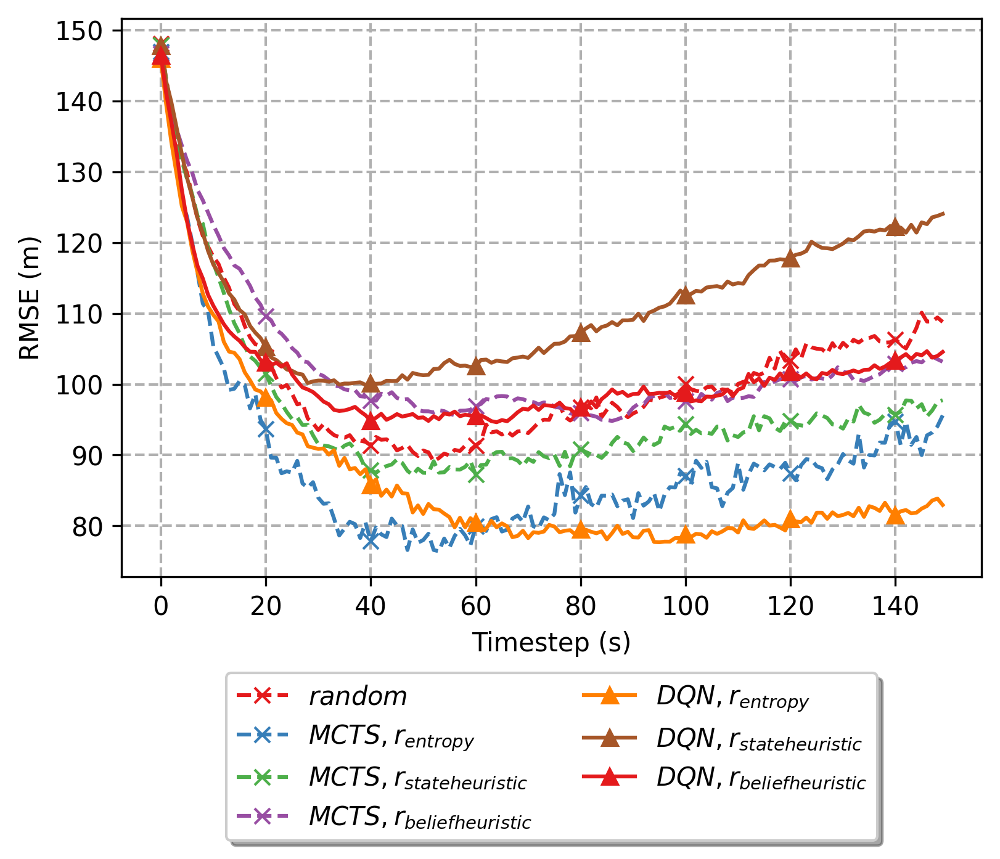

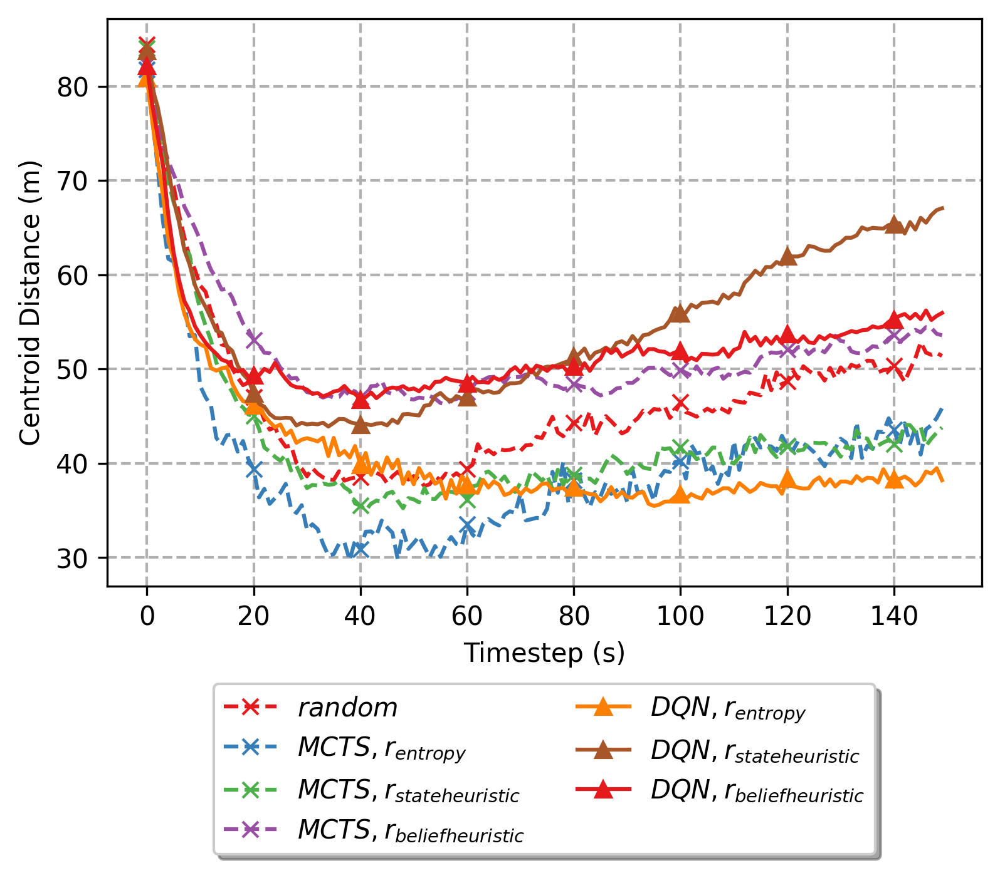

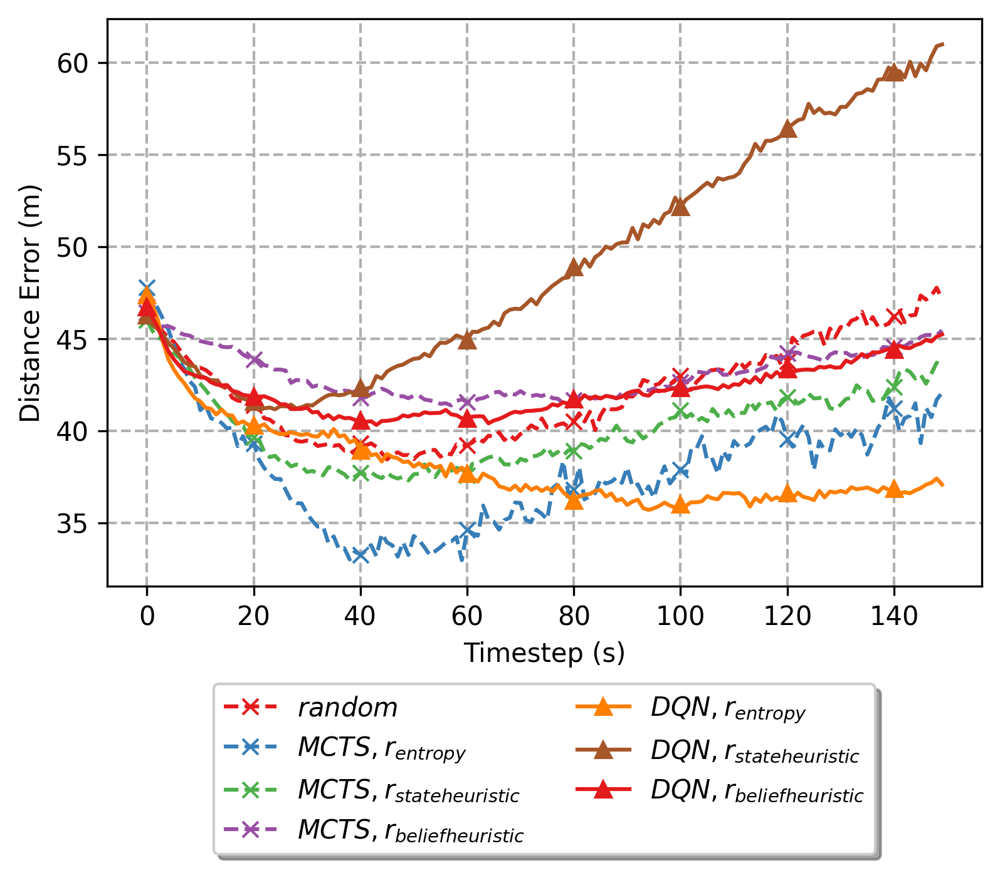

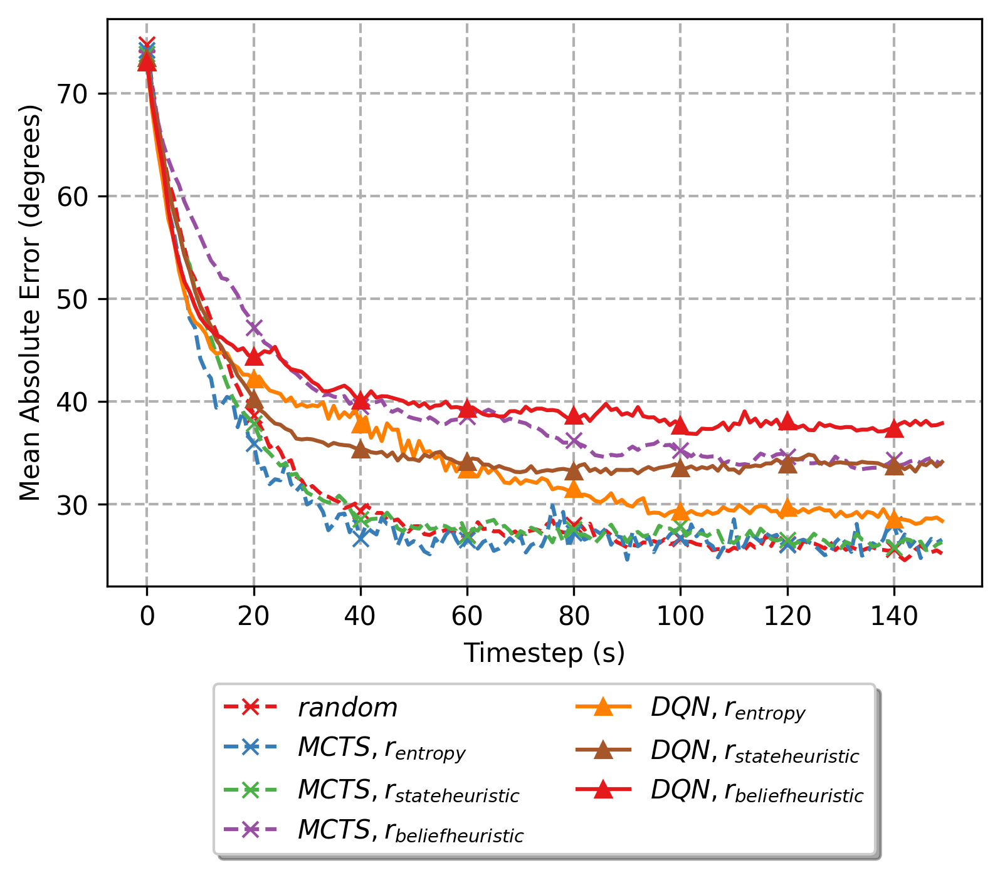

In [91]:
run_filter = {'sensor': 'doublerssi', 'particle_resample':0.01,}
doublerssi_mean_metric_reward_comparison(run_filter, 'rmse')
doublerssi_mean_metric_reward_comparison(run_filter, 'centroid_err')
doublerssi_mean_metric_reward_comparison(run_filter, 'r_err')
doublerssi_mean_metric_reward_comparison(run_filter, 'theta_err')


2022-04-18T12:20:21
2022-04-18T12:20:39
2022-04-18T12:21:35
2022-04-18T12:21:55
2022-04-18T12:23:38
2022-04-18T12:24:01


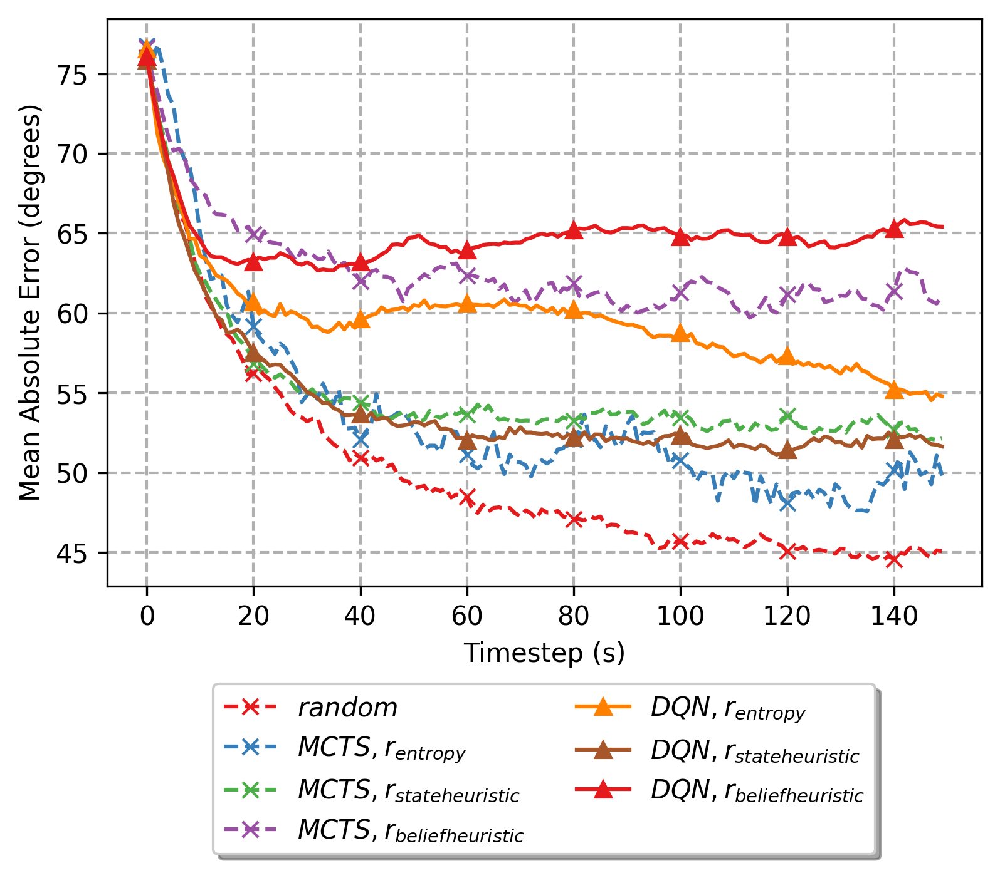

In [89]:
run_filter = {'sensor': 'doublerssilofi', 'particle_resample':0.01, 'likelihood':'weight2'}
doublerssi_mean_metric_reward_comparison(run_filter, 'theta_err')

2022-04-18T12:23:38
2022-04-18T12:24:01
random 8
2022-04-18T12:23:38
2022-04-18T12:24:01
random 8
2022-04-18T12:23:38
2022-04-18T12:24:01
random 8
2022-04-18T12:23:38
2022-04-18T12:24:01
random 8


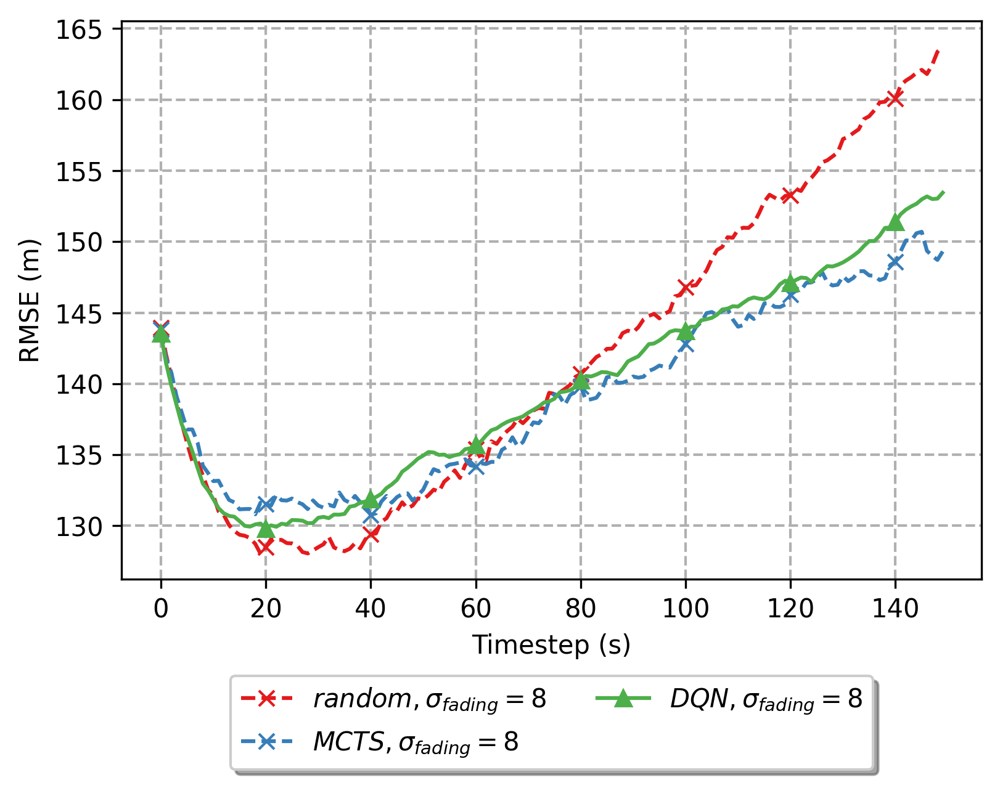

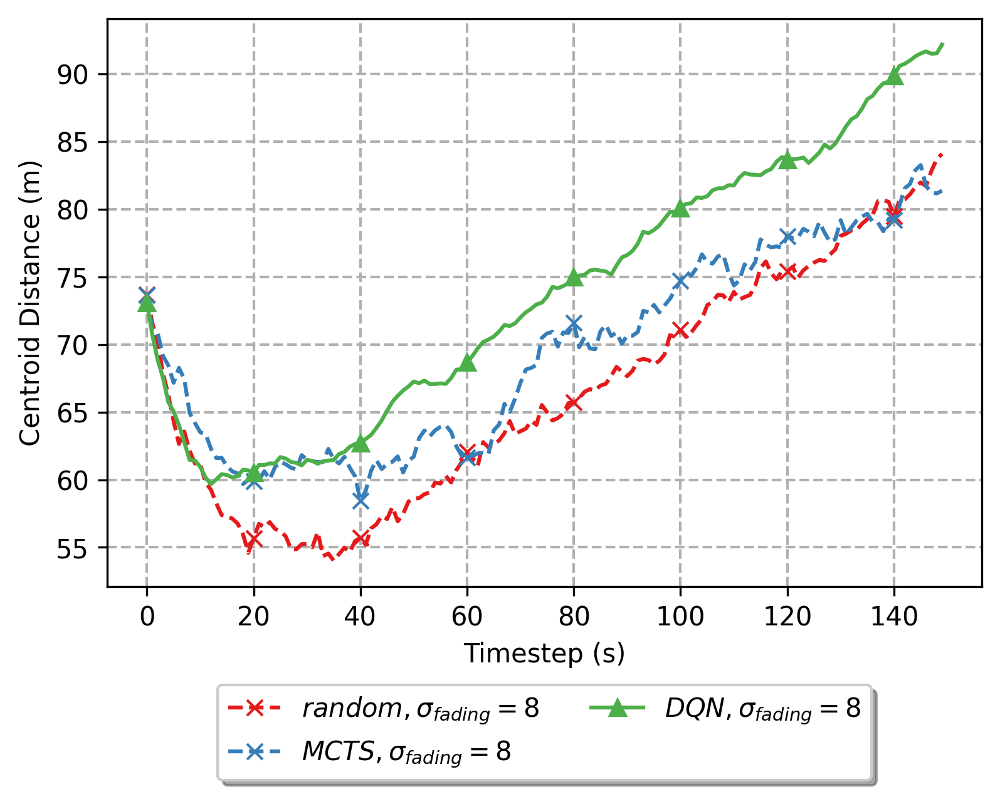

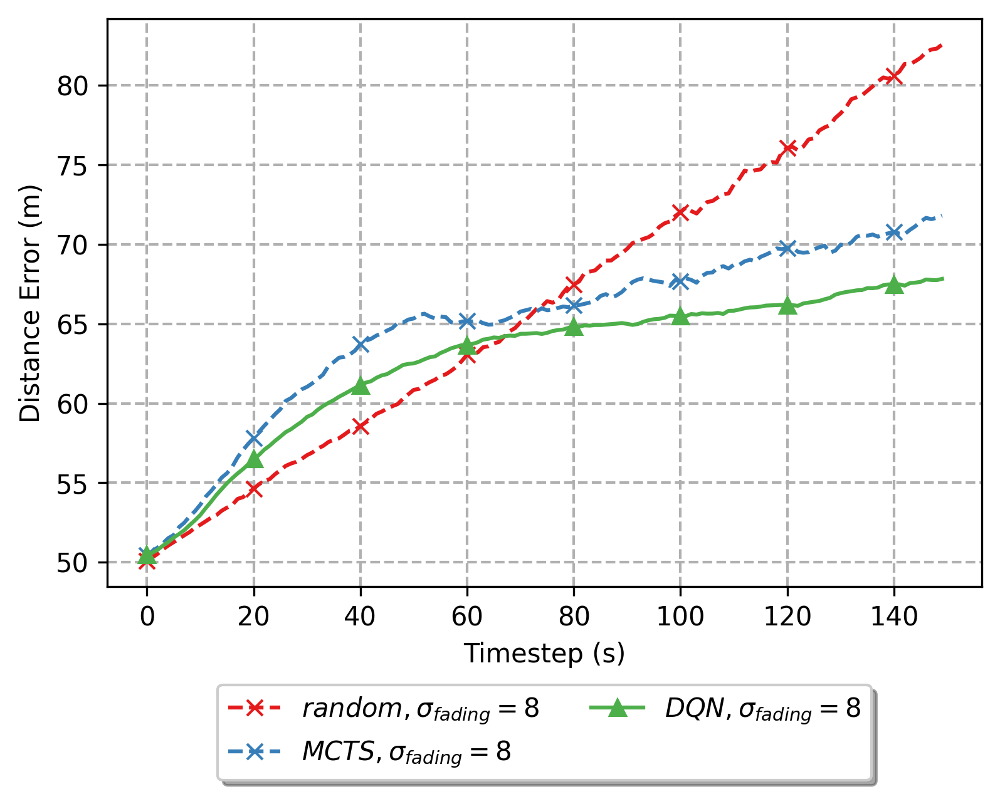

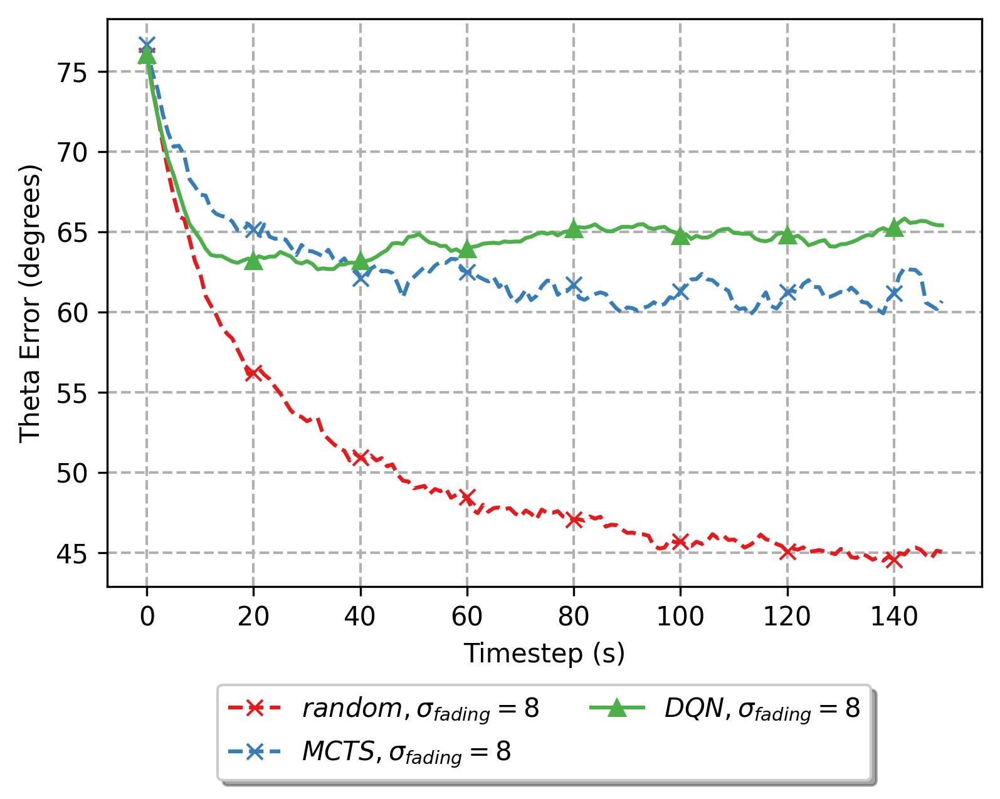

In [82]:

run_filter = {'sensor': 'doublerssilofi', 'reward':'heuristic_reward', 'particle_resample':0.01, 'likelihood':'weight2'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-18T12:21:35
2022-04-18T12:21:55
random 8
2022-04-18T12:21:35
2022-04-18T12:21:55
random 8
2022-04-18T12:21:35
2022-04-18T12:21:55
random 8
2022-04-18T12:21:35
2022-04-18T12:21:55
random 8


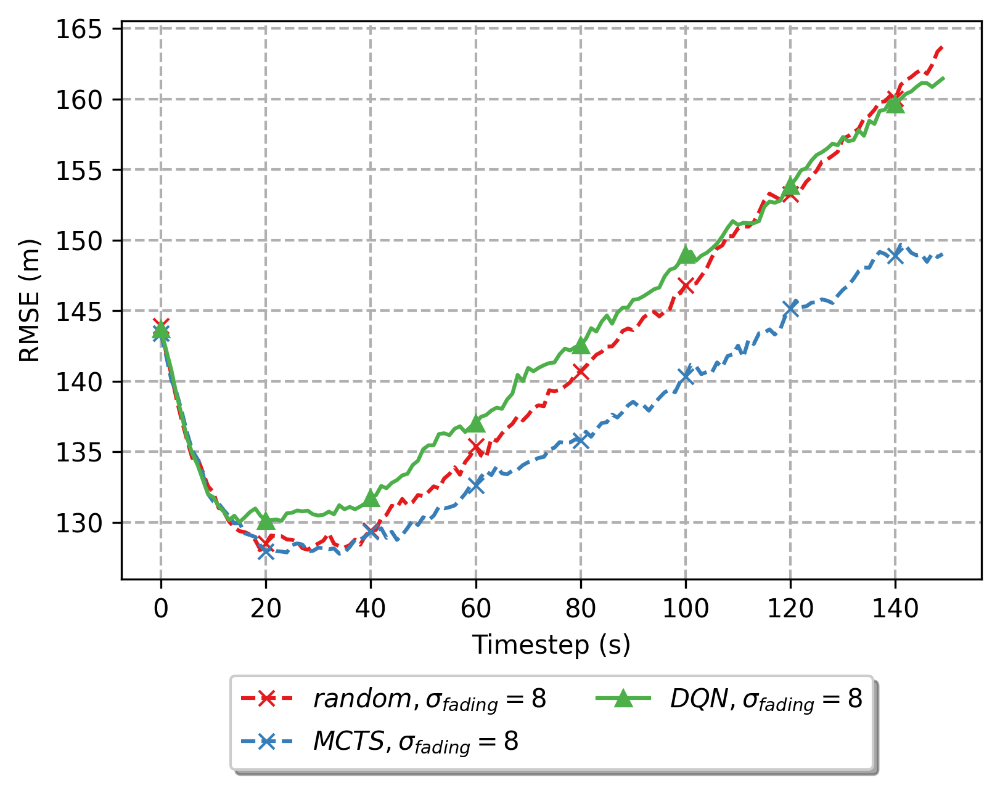

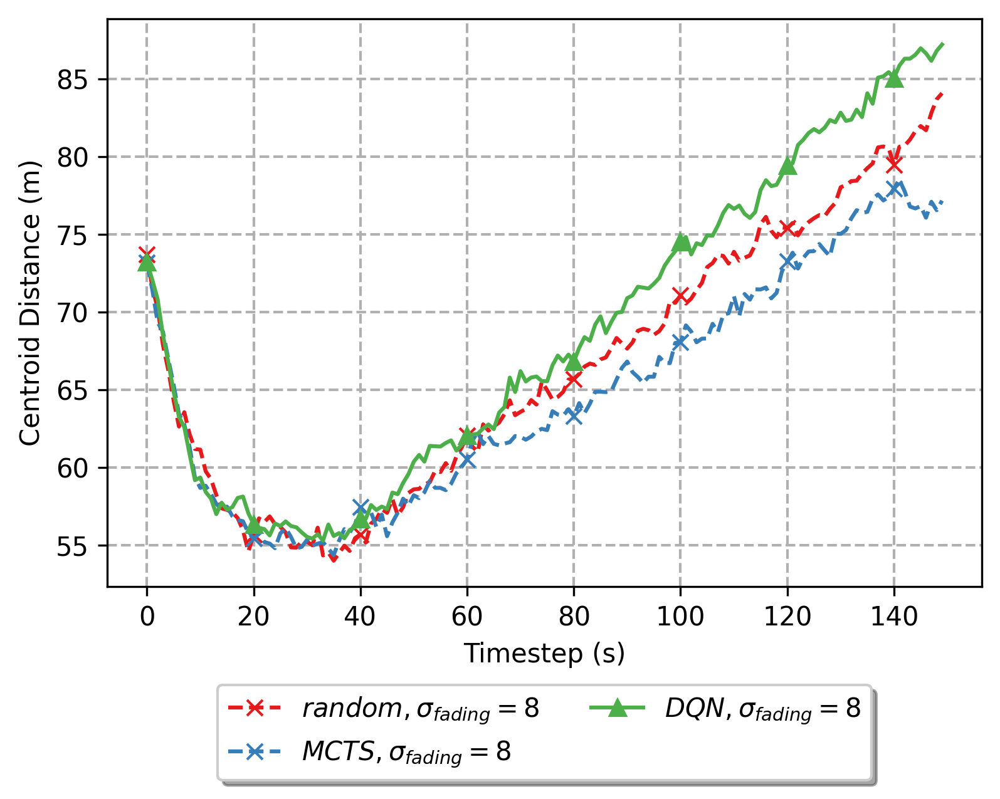

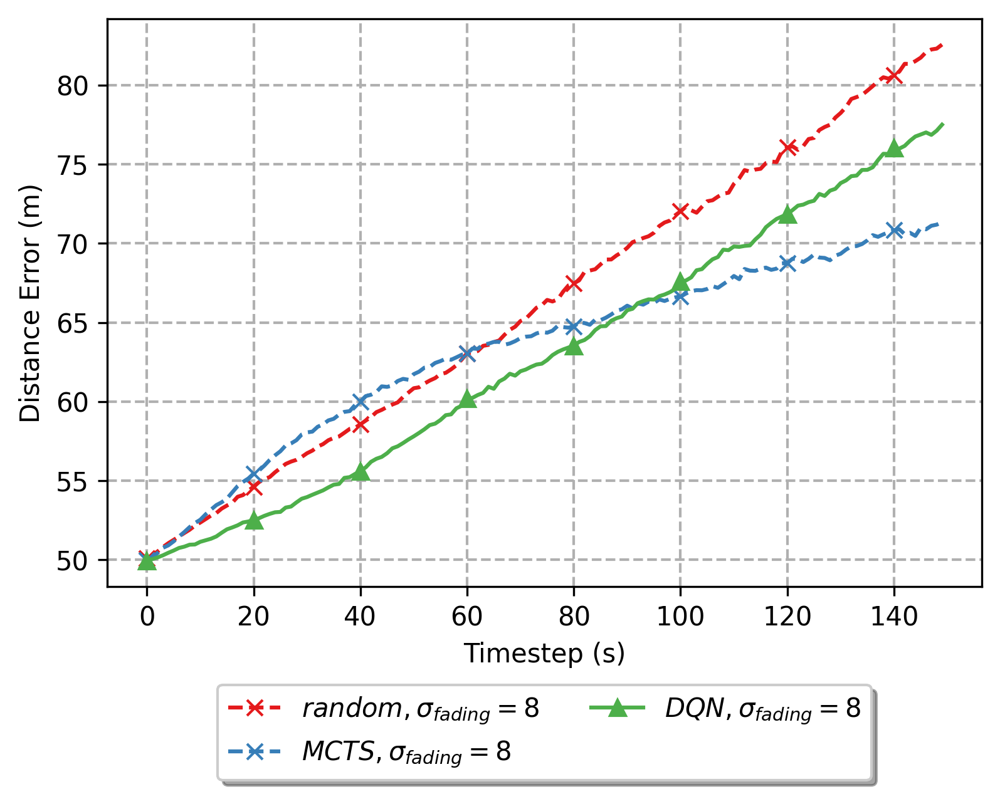

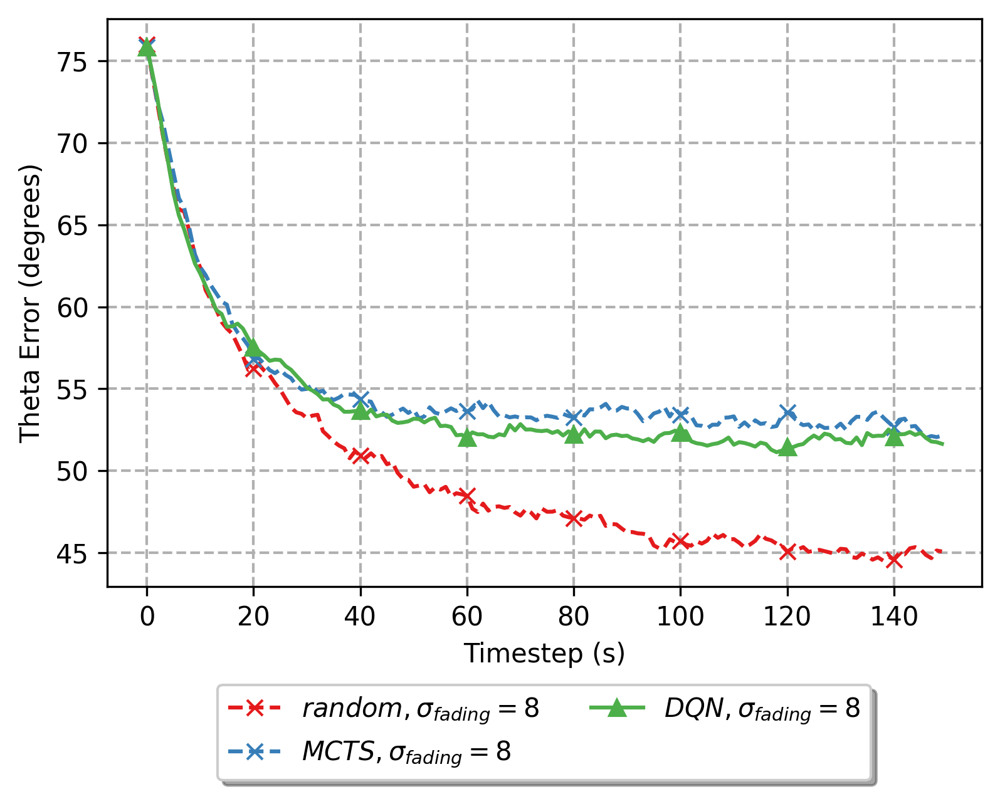

In [83]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'range_reward', 'particle_resample':0.01, 'likelihood':'weight2'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-18T12:20:21
2022-04-18T12:20:39
random 8
2022-04-18T12:20:21
2022-04-18T12:20:39
random 8
2022-04-18T12:20:21
2022-04-18T12:20:39
random 8
2022-04-18T12:20:21
2022-04-18T12:20:39
random 8


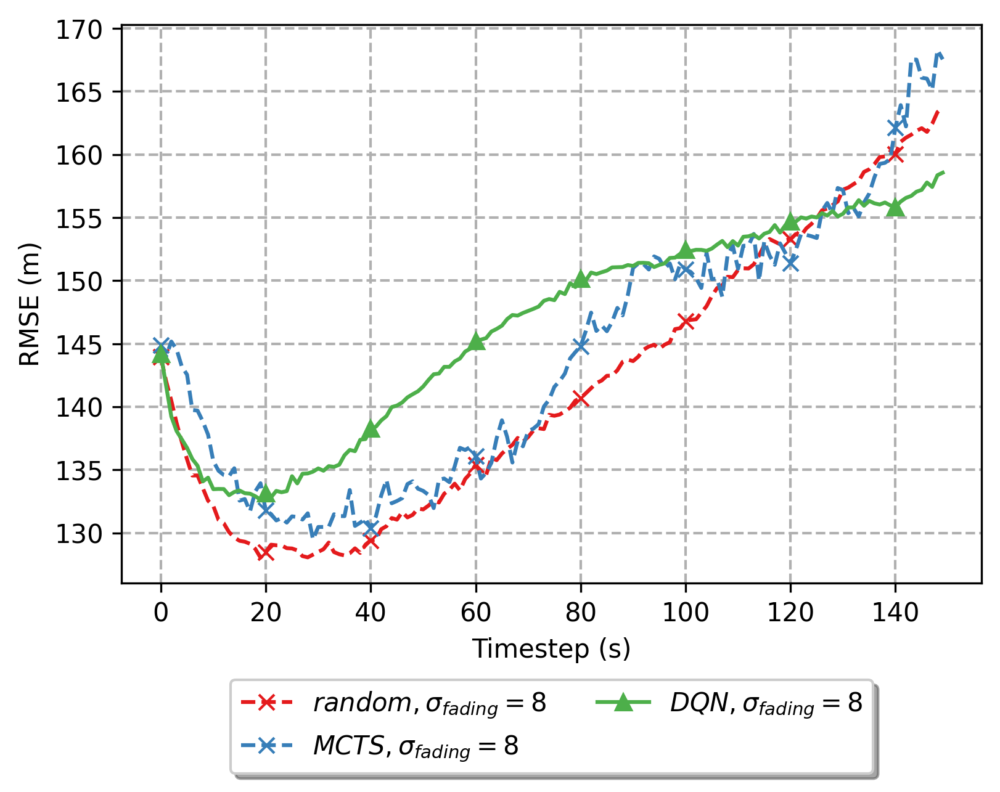

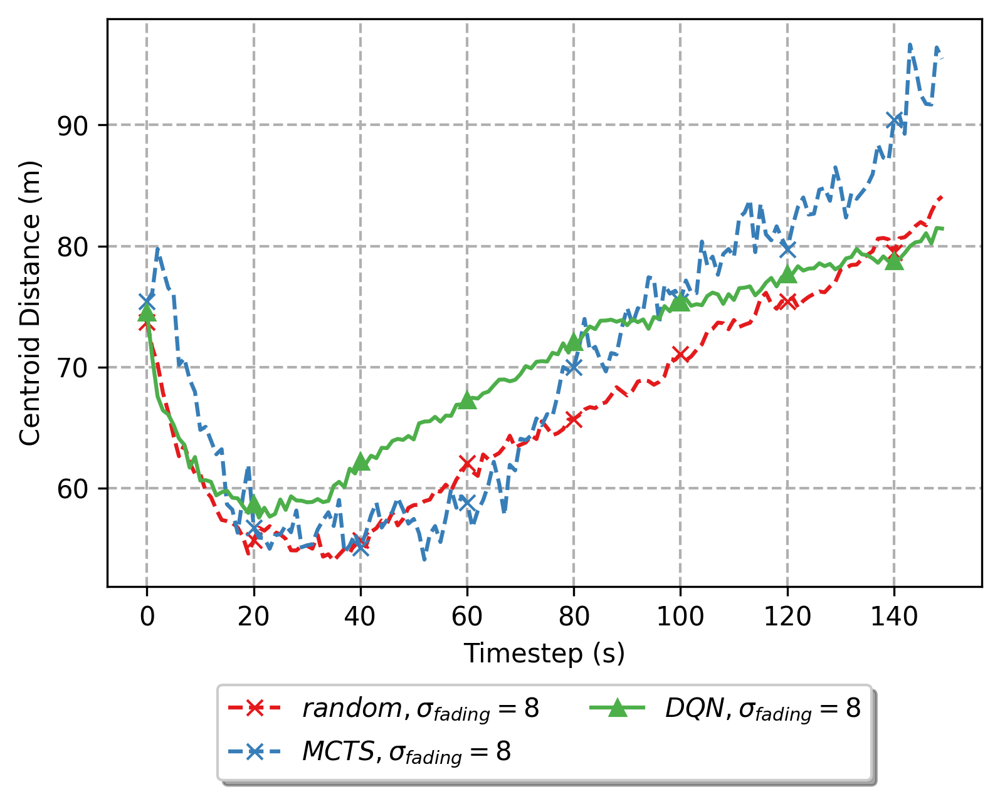

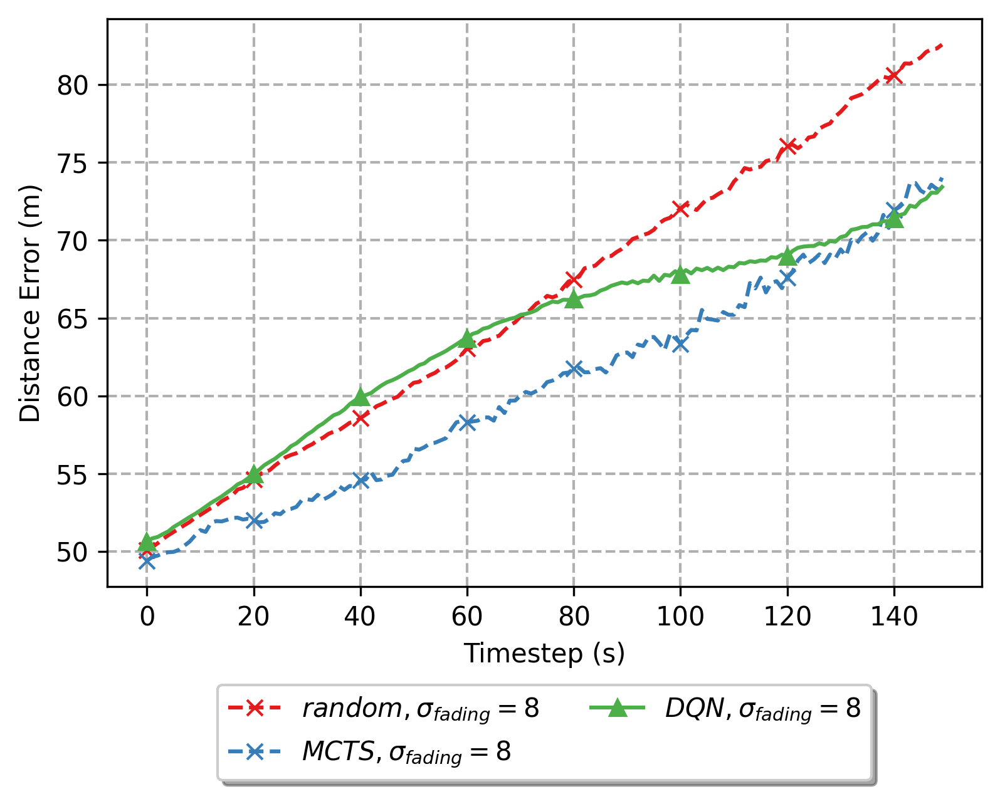

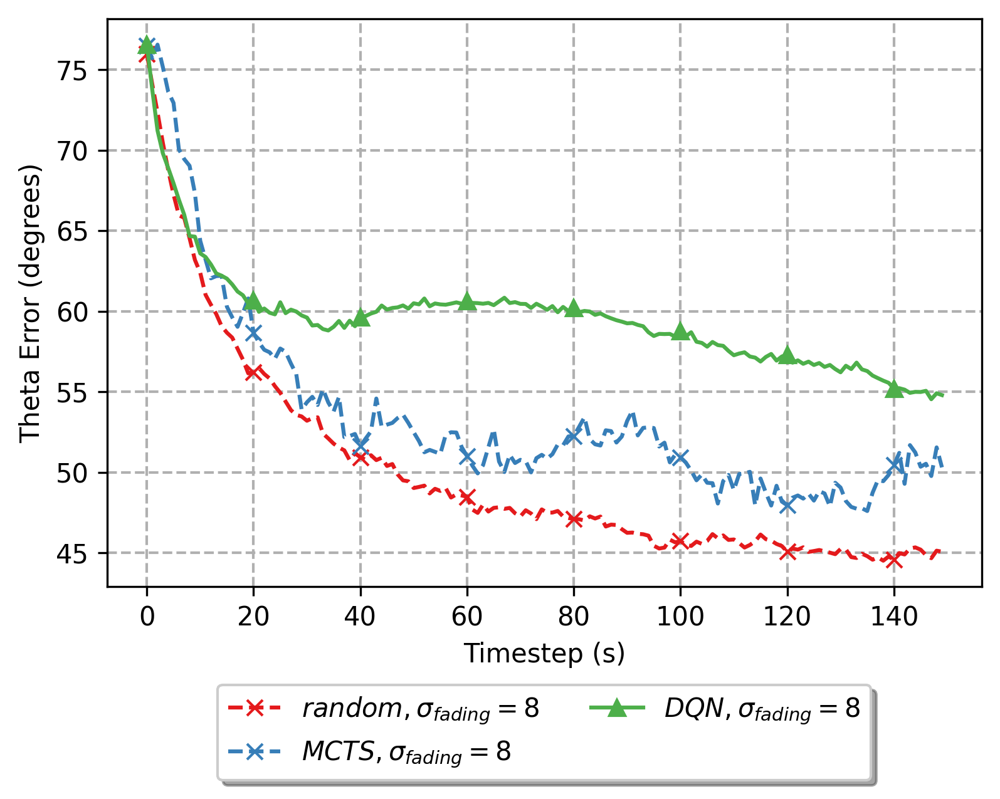

In [84]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'entropy_collision_reward', 'particle_resample':0.01, 'likelihood':'weight2'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-08T15:49:10
2022-04-13T16:41:24
random 8
static 8
2022-04-08T15:49:10
2022-04-13T16:41:24
random 8
static 8
2022-04-08T15:49:10
2022-04-13T16:41:24
random 8
static 8
2022-04-08T15:49:10
2022-04-13T16:41:24
random 8
static 8


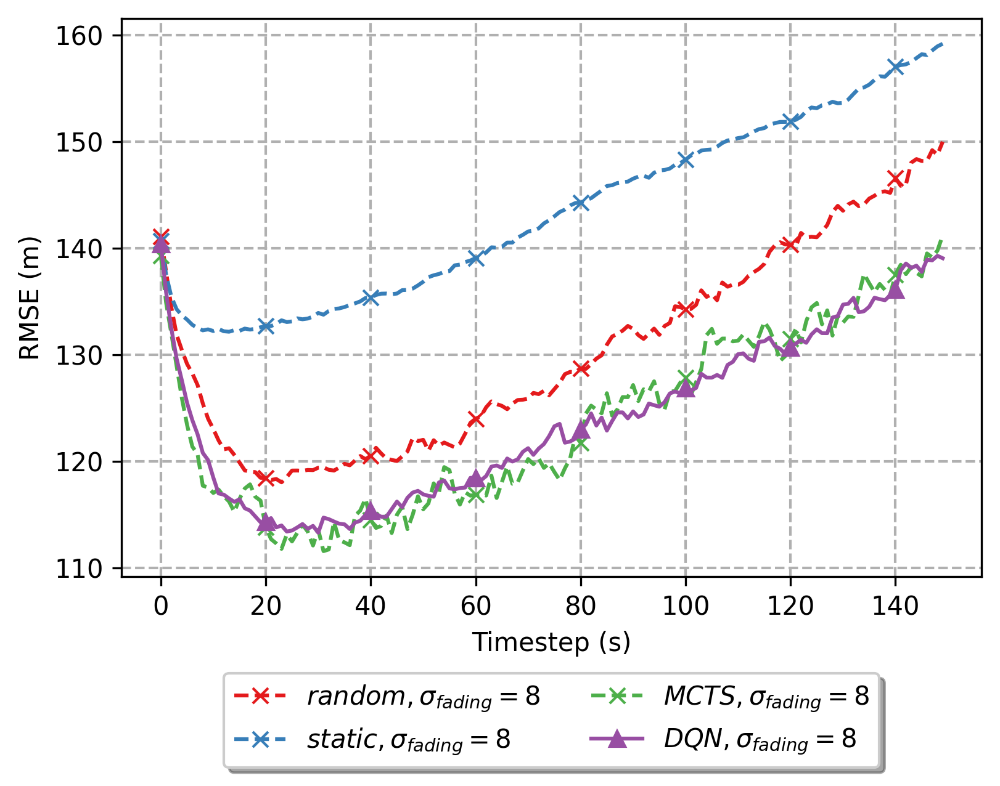

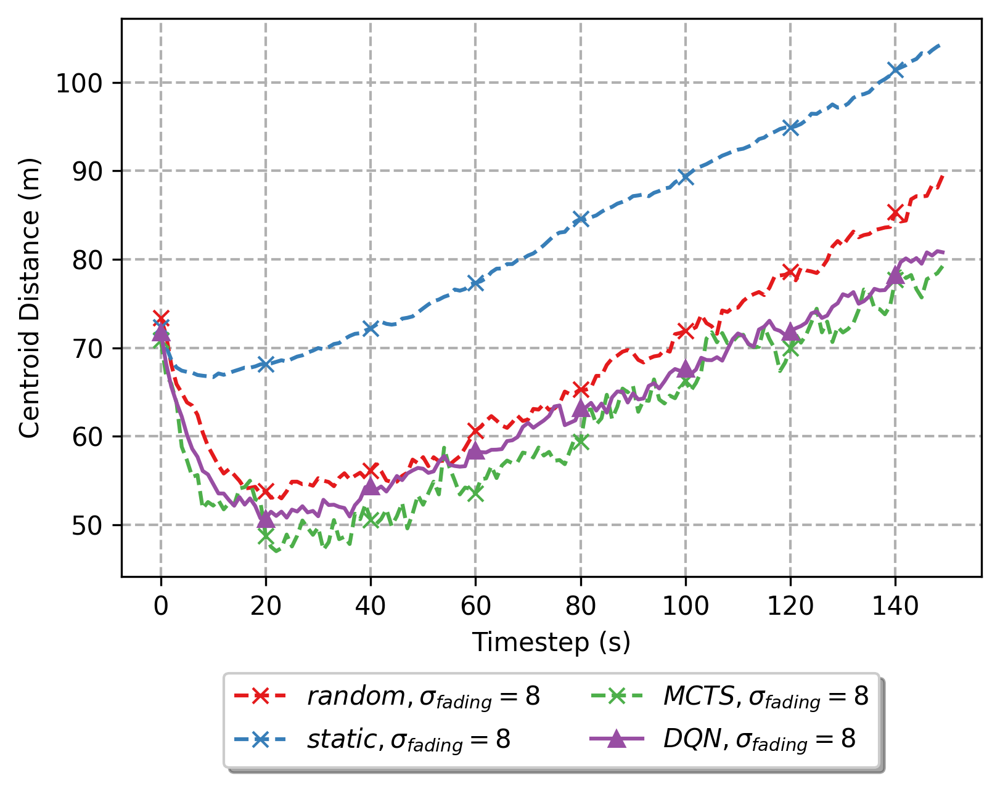

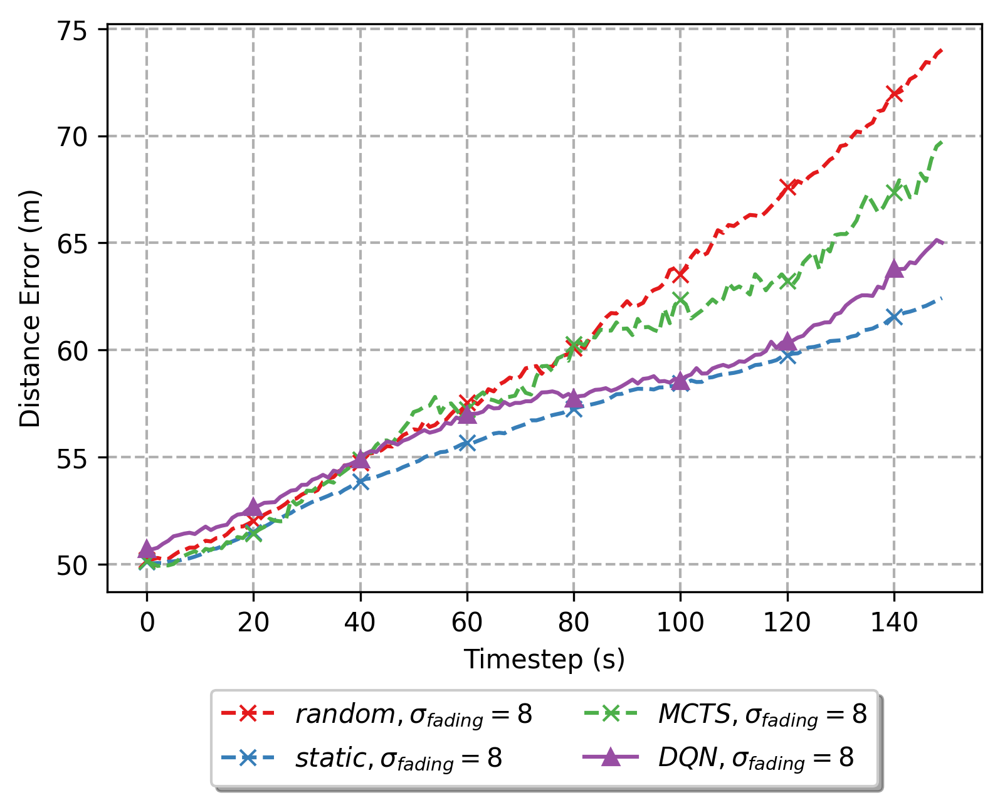

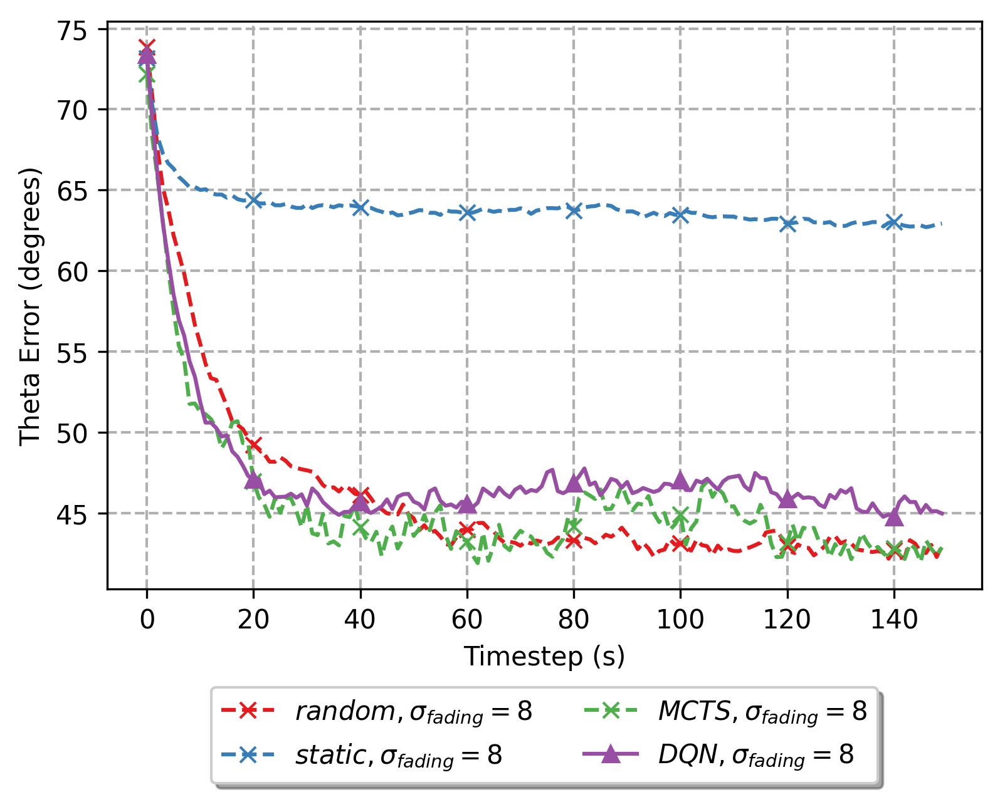

In [85]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'entropy_collision_reward', 'particle_resample':0.01, 'likelihood':'lofiv2', 'particle_diffuse':'True', 'version':'final_weight'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-08T15:49:10
2022-04-15T14:01:40
random 8
static 8
2022-04-08T15:49:10
2022-04-15T14:01:40
random 8
static 8
2022-04-08T15:49:10
2022-04-15T14:01:40
random 8
static 8
2022-04-08T15:49:10
2022-04-15T14:01:40
random 8
static 8


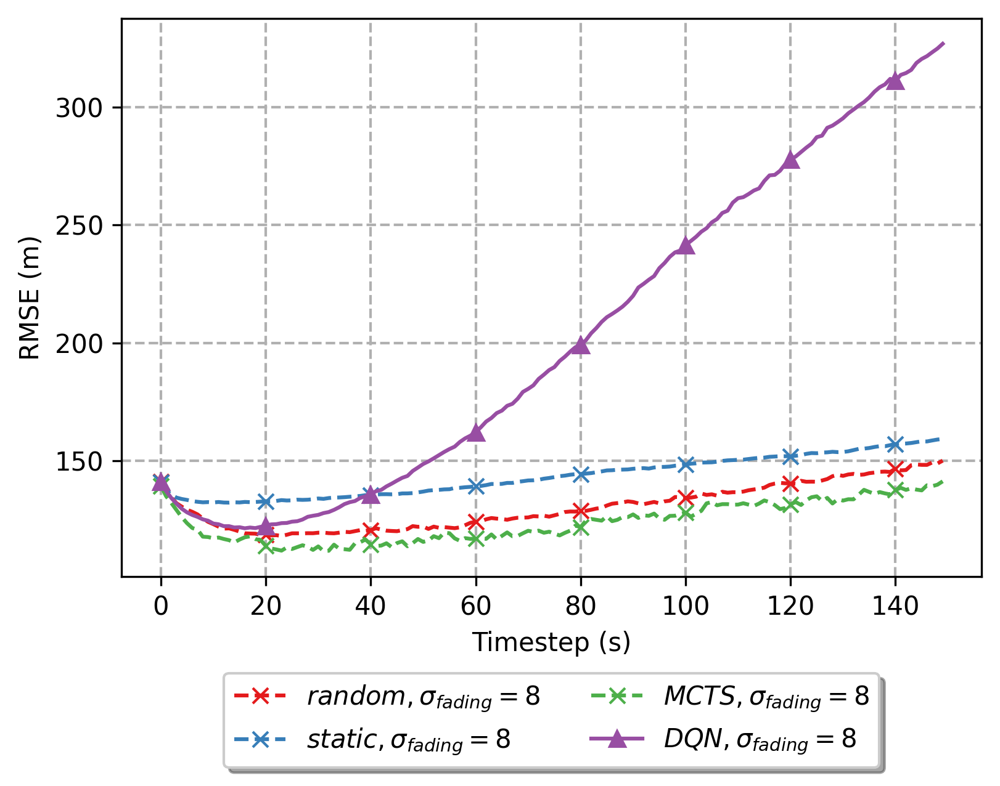

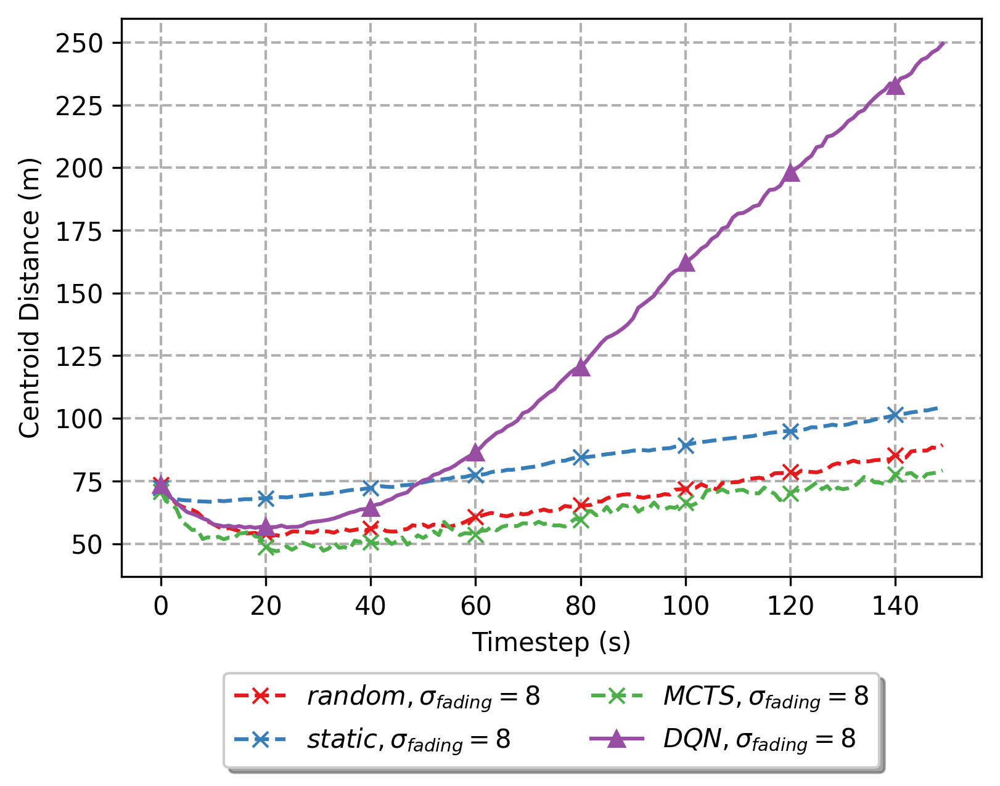

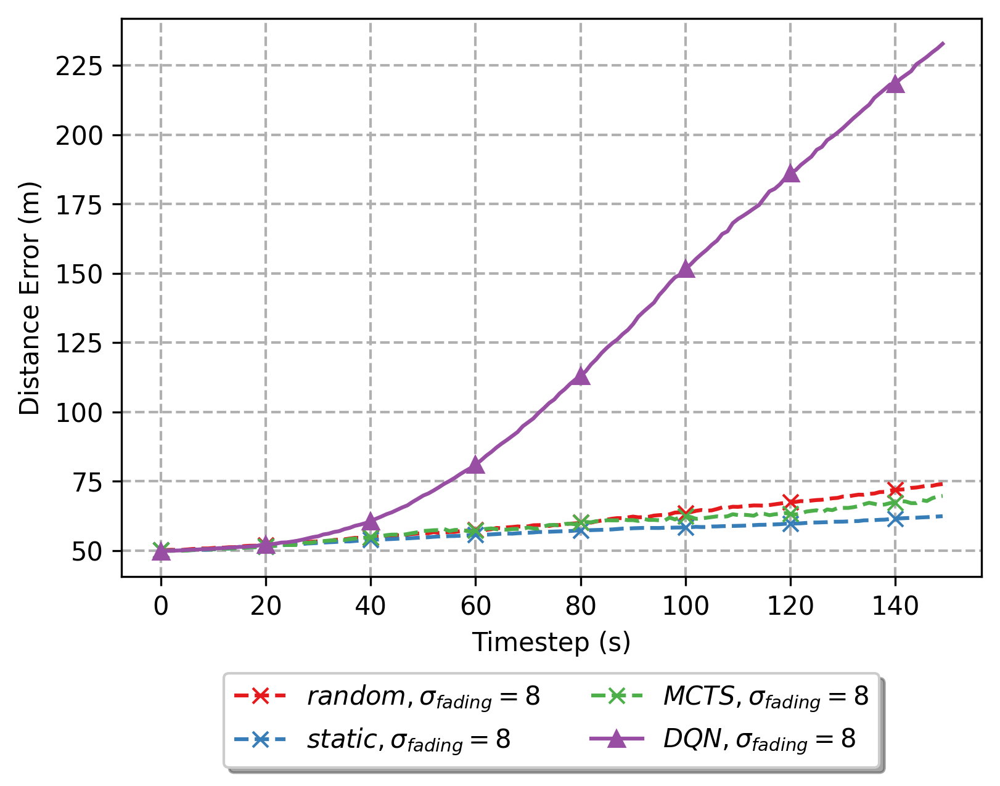

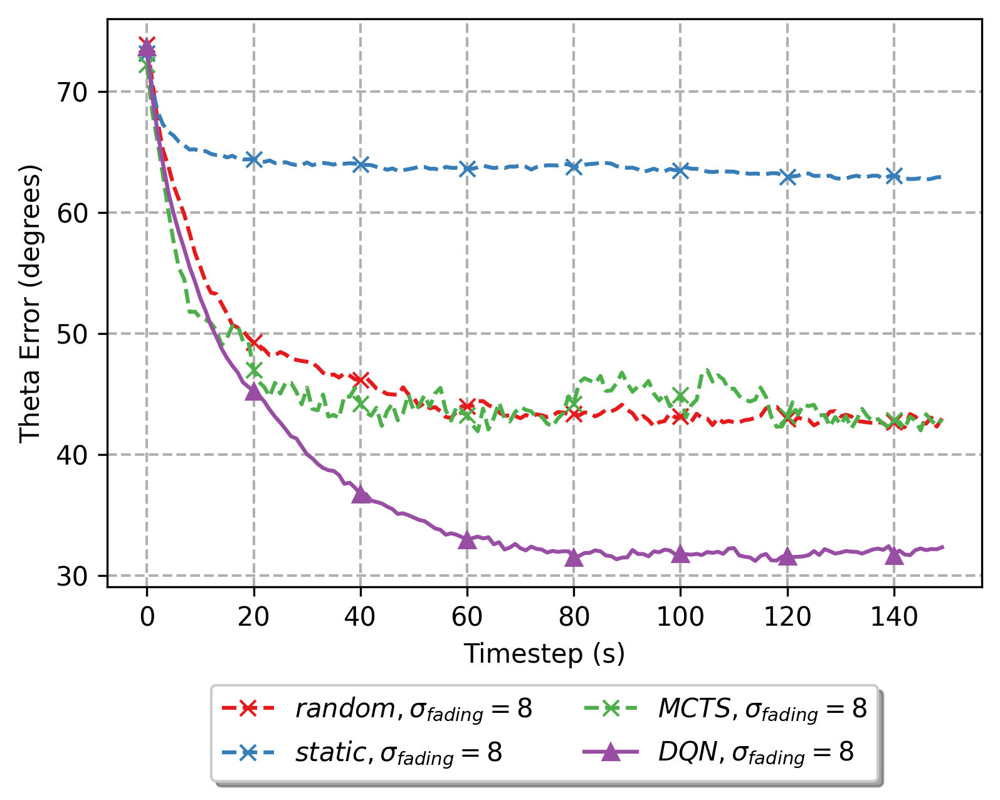

In [78]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'entropy_collision_reward', 'particle_resample':0.01, 'likelihood':'lofiv2', 'particle_diffuse':'True', }
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-09T09:53:34
2022-04-09T09:53:10
random 8
static 8
2022-04-09T09:53:34
2022-04-09T09:53:10
random 8
static 8
2022-04-09T09:53:34
2022-04-09T09:53:10
random 8
static 8
2022-04-09T09:53:34
2022-04-09T09:53:10
random 8
static 8


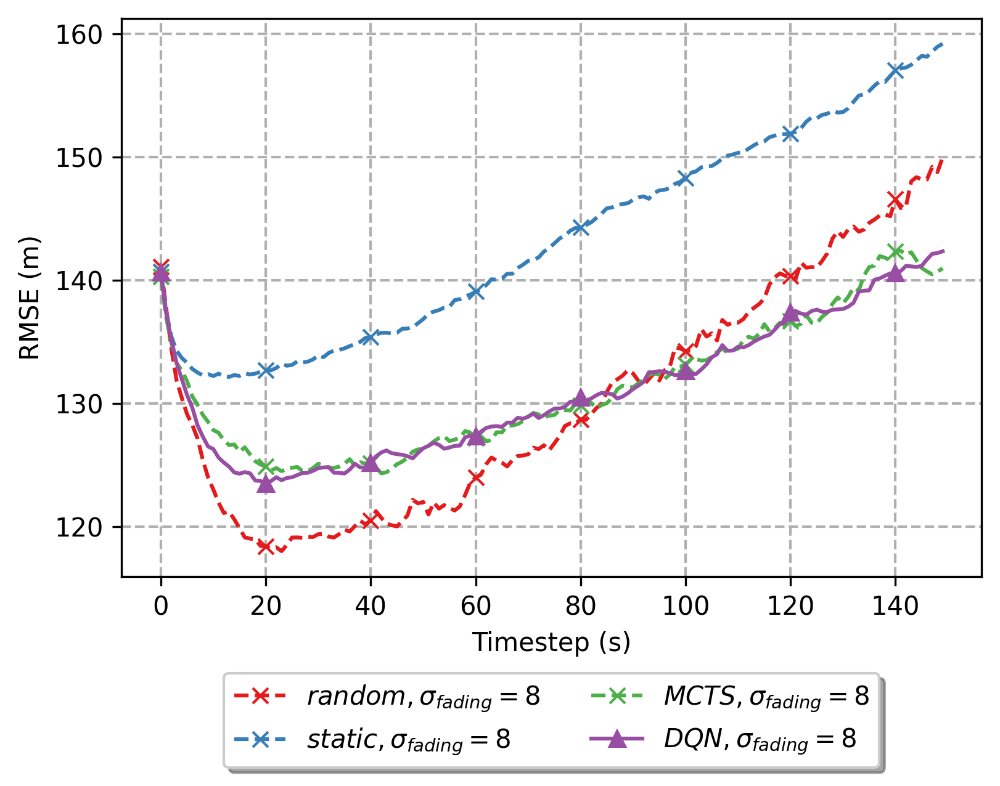

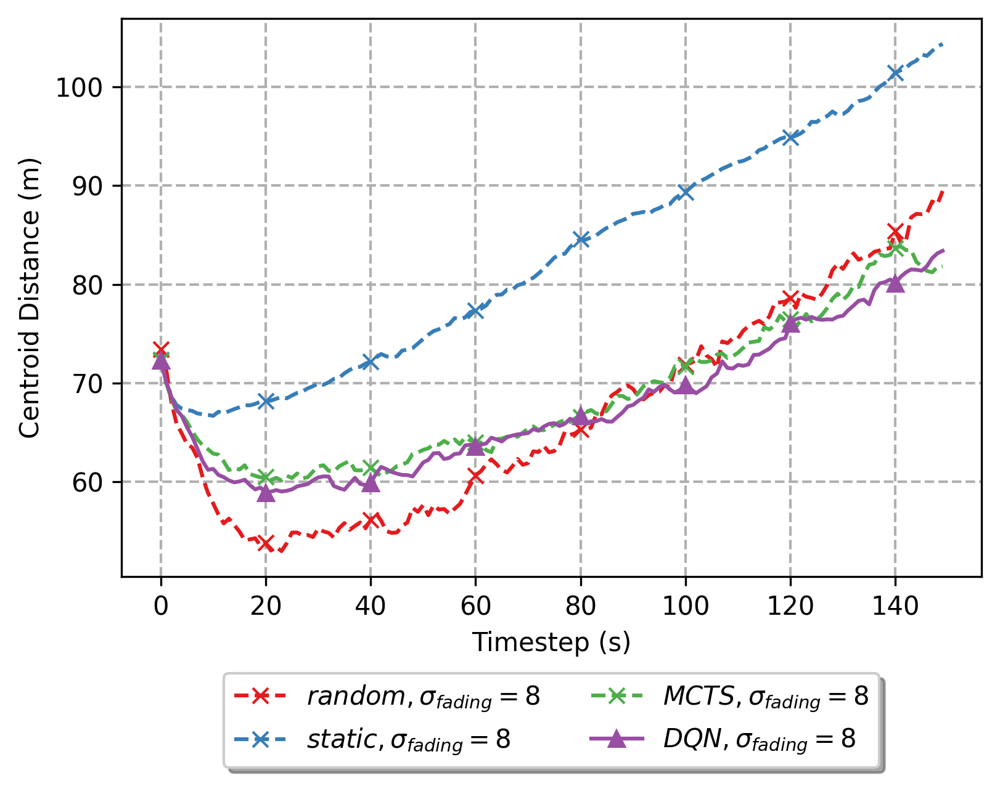

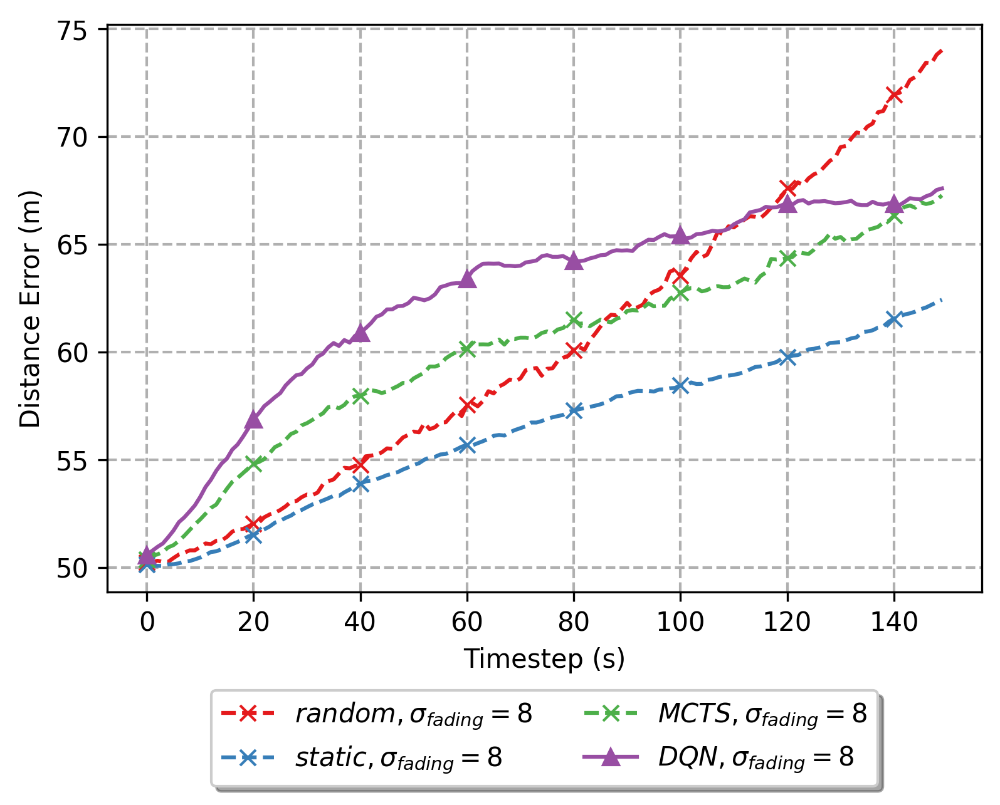

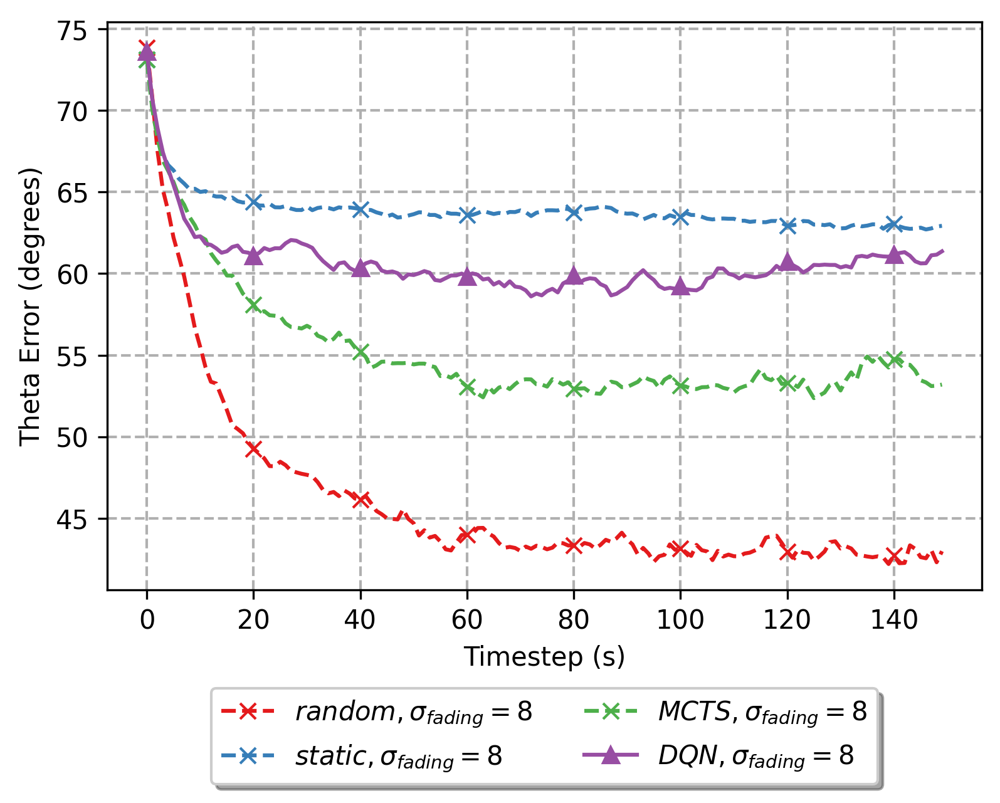

In [36]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'heuristic_reward', 'particle_resample':0.01, 'likelihood':'lofiv2', 'particle_diffuse':'True', 'version':'final_weight'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

2022-04-09T09:50:33
2022-04-09T09:51:12
random 8
static 8
2022-04-09T09:50:33
2022-04-09T09:51:12
random 8
static 8
2022-04-09T09:50:33
2022-04-09T09:51:12
random 8
static 8
2022-04-09T09:50:33
2022-04-09T09:51:12
random 8
static 8


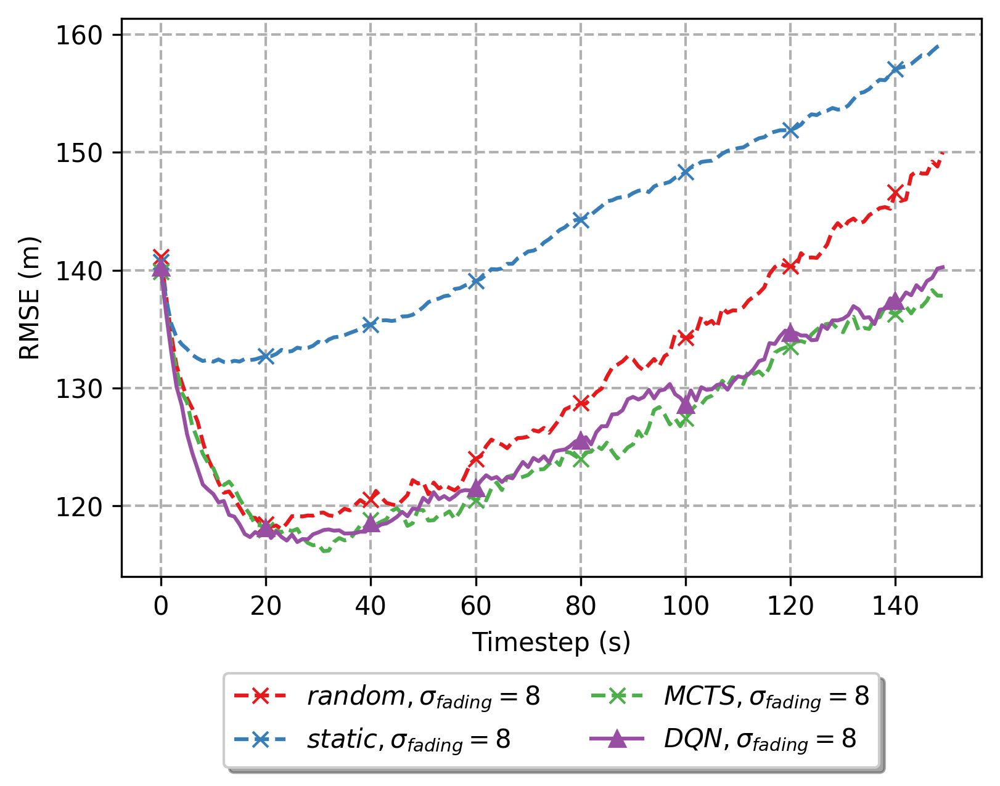

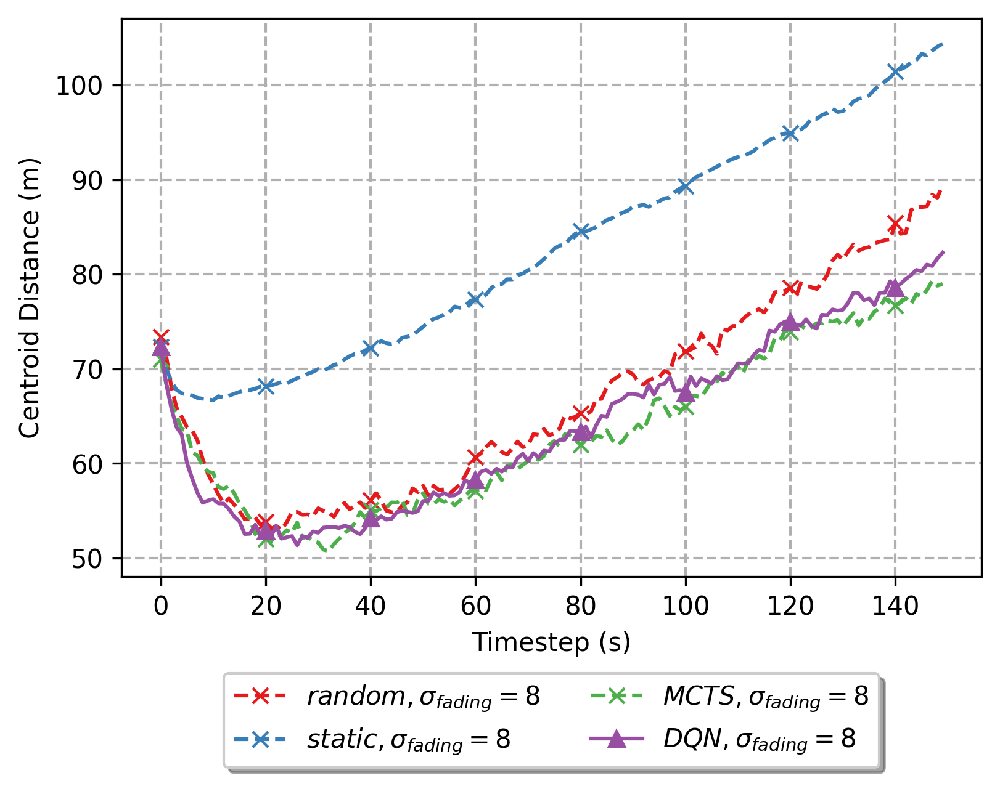

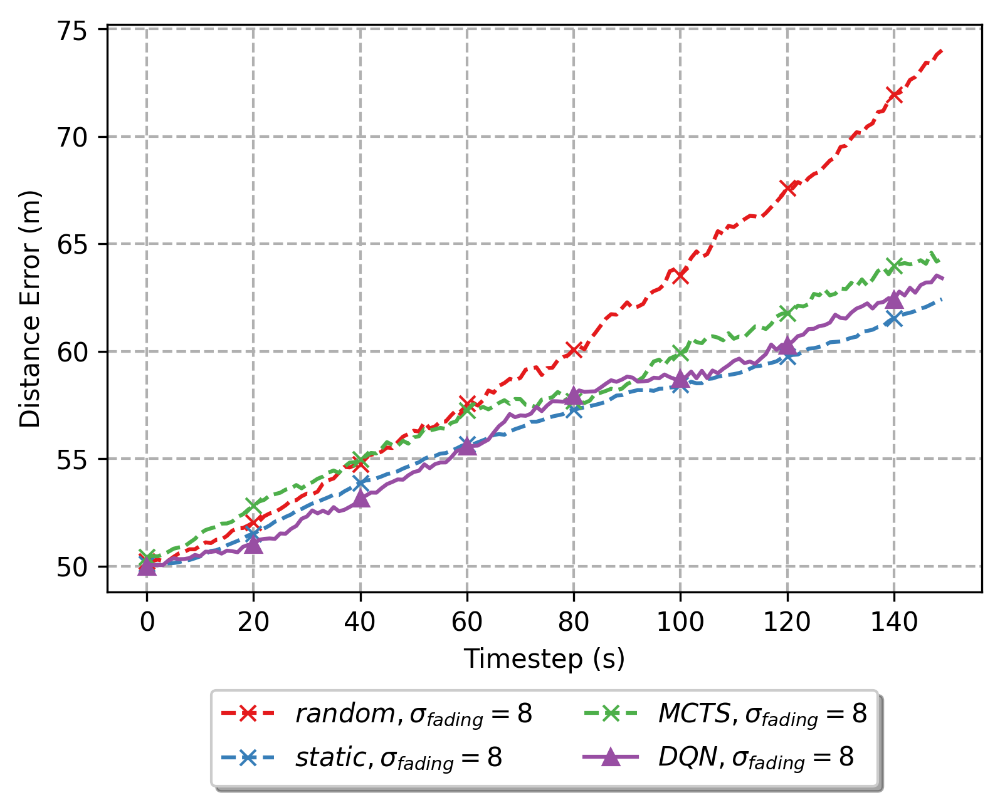

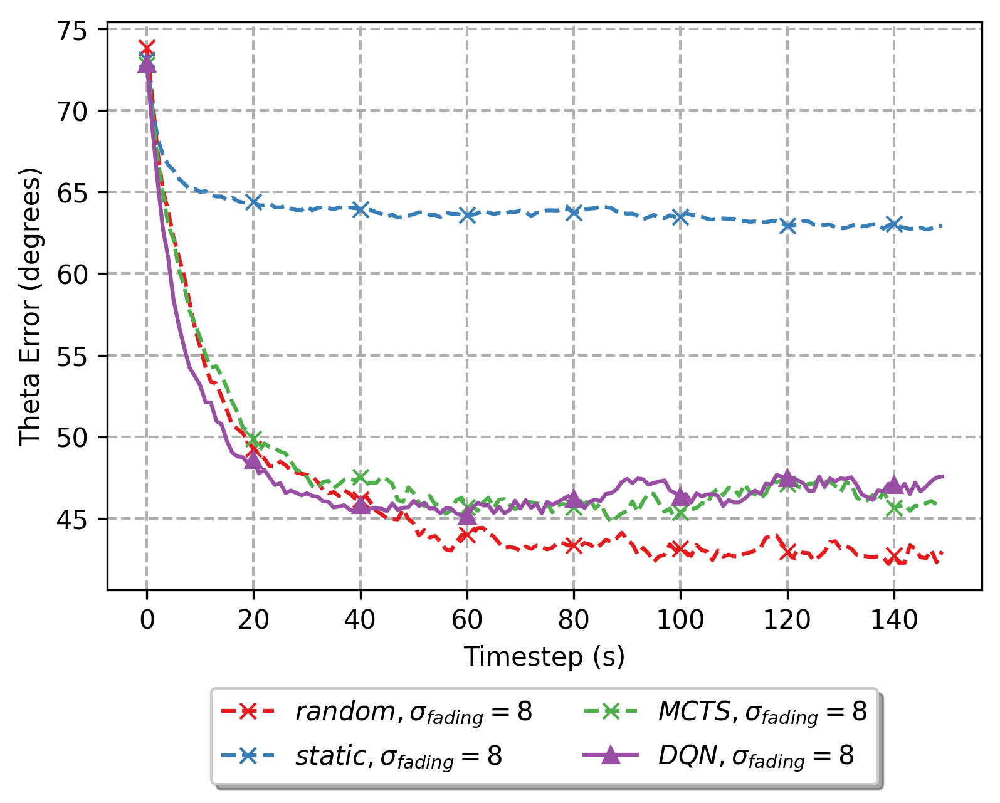

In [38]:
run_filter = {'sensor': 'doublerssilofi', 'reward':'range_reward', 'particle_resample':0.01, 'likelihood':'lofiv2', 'particle_diffuse':'True'}
doublerssi_mean_metric_sigma_comparison(run_filter, 'rmse', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'centroid_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'r_err', sigmas=[8])
doublerssi_mean_metric_sigma_comparison(run_filter, 'theta_err', sigmas=[8])

In [44]:
def doublerssi_mean_metric(method, run, metric): 
    
    config = get_config(method, run)
    data = get_data(method, run)


    n_runs = data.shape[0]
    mean_metric = []
    for n in range(n_runs): 
        a = re.split(',', re.sub('[\n]+', ',', data[metric][n]))
        b = [re.sub('[\[\]]+', '', aa).strip() for aa in a]
        c = [re.split('\s+', bb) for bb in b ]
        d = [[float(ccc) for ccc in cc] for cc in c]
        #d = np.array(d)
        d = np.mean(d, axis=1)

        mean_metric.append(d)
    mean_metric = np.array(mean_metric)
    mean_metric = np.mean(mean_metric, axis=0)
    # plt.figure()
    # plt.plot(d[:,0])
    # plt.plot(d[:,1])
    # plt.show()

    plt.figure()
    plt.plot(mean_metric)
    plt.xlabel('timestep')
    plt.ylabel(metric)
    plt.show()
def process_counts(counts, cumulative=True): 
    
    new_count = [0]
    for i in np.arange(1,len(counts)):
        if counts[i] - counts[i-1] == 2: 
            new_count.append(1)
        else: 
            new_count.append(0)
    if cumulative: 
        metric = np.cumsum(new_count)
        return metric 
    else: 
        return new_count
        
        

def doublerssi_mean_counts(method, run, metric, cumulative=True): 

    config = get_config(method, run)
    data = get_data(method, run)
    
    n_runs = data.shape[0]
    mean_count = []
    for n in range(n_runs): 
        a = re.sub('[\n.\[\]]+', '', data[metric][n])
        b = re.split('\s+', a.strip())
        c = np.array([int(bb) for bb in b])
        c = process_counts(c, cumulative)
        #print(c)
        mean_count.append(c)
    mean_count = np.array(mean_count)
    mean_count = np.mean(mean_count, axis=0)
    plt.figure()
    plt.plot(mean_count)
    plt.xlabel('timestep')
    plt.ylabel(metric)
    plt.show()
    
def doublerssi_mean_count(data, metric, cumulative=True, process=True): 


    n_runs = data.shape[0]
    mean_count = []
    for n in range(n_runs): 
        
#         if process: 
#             asdf
#             a = re.sub('[\n.\[\]]+', '', data[metric][n])
#             b = re.split('\s+', a.strip())
#             c = np.array([int(bb) for bb in b])
#             c = process_counts(c, cumulative)
#         else: 
#             a = re.sub('[\n\[\]]+', '', data[metric][n])
#             b = re.split('\s+', a.strip())
#             c = np.array([float(bb) for bb in b])
        a = re.sub('[\n\[\]]+', '', data[metric][n])
        b = re.split('\s+', a.strip())
        c = np.array([float(bb) for bb in b])
        #print(c)
        mean_count.append(c)
    
    mean_count = np.array(mean_count)
    mean_count = np.mean(mean_count, axis=0)

#     plt.figure()
#     plt.plot(mean_count)
#     plt.xlabel('timestep')
#     plt.ylabel(metric)
#     plt.show()
    return mean_count

def doublerssi_mean_counts_comparison(run_filter, metric, cumulative=False): 
    
    mcts_runs = filter_runs('mcts', run_filter)
    mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
    dqn_runs = filter_runs('dqn', run_filter)
    dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)

    mcts_data = get_data('mcts', mcts_runs[0])
    dqn_data = get_data('dqn', dqn_runs[0])


    #assert mcts_data.shape[0] == dqn_data.shape[0]
    
    mcts_mean = doublerssi_mean_count(mcts_data, metric, cumulative=cumulative)
    dqn_mean = doublerssi_mean_count(dqn_data, metric, cumulative=cumulative)
    
    fig, ax = plt.subplots()
    ax.plot(mcts_mean, color='blue', marker='x', markevery=10, label='MCTS')
    ax.plot(dqn_mean, color='green', marker='D', markevery=10, label='DQN')
    #ax.set_ylim(bottom=-0.05)
    ax.set_xlabel('timestep')
    ax.set_ylabel(metric)
    ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True,)
    ax.grid( linestyle = '--', linewidth = 1)
    
def doublerssi_reward_comparison(run_filter, metric, cumulative=False): 
    
    mcts_datas = []
    dqn_datas = []
    rewards = ['entropy_collision_reward', 'range_reward']
    for reward in rewards: 
        run_filter['reward'] = reward
        
        mcts_runs = filter_runs('mcts', run_filter)
        mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
        dqn_runs = filter_runs('dqn', run_filter)
        dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
        print(reward)
        print(mcts_runs)
        print(dqn_runs)
        mcts_data = get_data('mcts', mcts_runs[0])
        dqn_data = get_data('dqn', dqn_runs[0])

        #assert mcts_data.shape[0] == dqn_data.shape[0]

        mcts_mean = doublerssi_mean_count(mcts_data, metric, cumulative=cumulative)
        dqn_mean = doublerssi_mean_count(dqn_data, metric, cumulative=cumulative)
        
        mcts_datas.append(mcts_mean)
        dqn_datas.append(dqn_mean)
    
    fig, ax = plt.subplots(figsize=(6,4), dpi=300)
    ax.set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    reward_label = {'entropy_collision_reward':'entropy', 'range_reward':'heuristic'}
    for i,reward in enumerate(rewards): 
        ax.plot(mcts_datas[i], marker='x', markevery=20, linestyle='--', label=r'$MCTS, r_{{{}}}$'.format(reward_label[reward]))
    
    for i,reward in enumerate(rewards): 
        ax.plot(dqn_datas[i], marker='^', markevery=20, label=r'$DQN, r_{{{}}}$'.format(reward_label[reward]))
    
    ax.set_xlabel('Timestep (s)')
    metric_label = {'lost':'"Lost" rate', 'collisions':'"Collision" rate'}
    ax.set_ylabel(metric_label[metric])
    
    #ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True, ncol=2)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5,-0.15), fancybox=True, shadow=True, ncol=2)
    ax.grid( linestyle = '--', linewidth = 1)
    
    ####
    
def get_heuristic_metric_data(run_filter, metric, cumulative=False, process=True): 
    mcts_datas = {}
    dqn_datas = {}
    rewards = ['entropy_collision_reward', 'range_reward', 'heuristic_reward']
    for reward in rewards: 
        run_filter['reward'] = reward
        
        mcts_runs = filter_runs('mcts', run_filter)
        if len(mcts_runs) > 0: 
            mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            mcts_data = get_data('mcts', mcts_runs[0])
            print('mcts = ',mcts_runs[0])
            mcts_mean = doublerssi_mean_count(mcts_data, metric, cumulative=cumulative, process=process)
            mcts_datas[reward] = mcts_mean
        else: 
            mcts_datas[reward] = None

        dqn_runs = filter_runs('dqn', run_filter)
        if len(dqn_runs) > 0: 
            dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
            dqn_data = get_data('dqn', dqn_runs[0])
            print('dqn = ',dqn_runs[0])
            dqn_mean = doublerssi_mean_count(dqn_data, metric, cumulative=cumulative, process=process)
            dqn_datas[reward] = dqn_mean
        else: 
            dqn_datas[reward] = None

    return mcts_datas, dqn_datas

def get_baseline_heuristic_metric_data(baseline_filter, metric, cumulative=False, process=True): 
    #baseline_datas = []
    baseline_filter.pop('reward',None)
    baseline_runs = filter_runs('baseline', baseline_filter)
    print(len(baseline_runs))
    if len(baseline_runs) == 0: 
        
        return None
    baseline_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)

    baseline_data = get_data('baseline', baseline_runs[0])

    baseline_mean = doublerssi_mean_count(baseline_data, metric, cumulative=cumulative, process=process)


    #baseline_datas.append(baseline_mean)

    return baseline_mean

def doublerssi_heuristic_metric_comparison(run_filter, cumulative=False): 
    
    if run_filter.get('delta_col',None) is not None: 
        process=False
    else: 
        process=True
    metrics = ['lost', 'collisions']
    rewards = ['entropy_collision_reward', 'range_reward', 'heuristic_reward']
    baseline_policies = ['static', 'random']
    fig, axs = plt.subplots(2,1, figsize=(6,8), dpi=300, sharex=True)
    axs[0].set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    axs[1].set_prop_cycle('color',plt.cm.get_cmap('Set1')(np.linspace(0,1,9))[[0,1,2,3,4,6],:])
    reward_label = {'entropy_collision_reward':'entropy', 'range_reward':'state heuristic', 'heuristic_reward':'belief heuristic'}
    metric_label = {'lost':'"Lost" rate', 'collisions':'"Collision" rate'}
    
    
    for m in range(len(metrics)): 
        for policy in baseline_policies: 
            baseline_filter = run_filter.copy()
            baseline_filter['policy'] = policy
            baseline_mean = get_baseline_heuristic_metric_data(baseline_filter, metrics[m], cumulative, process)
            if baseline_mean is not None: 
                axs[m].plot(baseline_mean, marker='x', markevery=20, linestyle='--', label=r'${}$'.format(policy))

        mcts_datas, dqn_datas = get_heuristic_metric_data(run_filter, metrics[m], cumulative, process)
        for i,reward in enumerate(rewards): 
            if mcts_datas[reward] is not None: 
                axs[m].plot(mcts_datas[reward], marker='x', markevery=20, linestyle='--', label=r'$MCTS, r_{{{}}}$'.format(reward_label[reward]))

        for i,reward in enumerate(rewards): 
            if dqn_datas[reward] is not None: 
                axs[m].plot(dqn_datas[reward], marker='^', markevery=20, label=r'$DQN, r_{{{}}}$'.format(reward_label[reward]))

        axs[m].set_ylabel(metric_label[metrics[m]])
        axs[m].grid( linestyle = '--', linewidth = 1)
    axs[1].set_xlabel('Timestep (s)')
    
    #ax.legend(loc='center left', bbox_to_anchor=(1.0,0.5), fancybox=True, shadow=True, ncol=2)
    axs[1].legend(loc='upper center', bbox_to_anchor=(0.5,-0.15), fancybox=True, shadow=True, ncol=3)
    

In [40]:
run_filter = {'sensor': 'doublerssi', 'delta_col':'15', 'policy':'static'}
get_baseline_heuristic_metric_data(run_filter, 'collisions', cumulative=False, process=False)

0


In [41]:
run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':8, 'particle_diffuse':'True'}
get_baseline_heuristic_metric_data(run_filter, 'lost', cumulative=False, process=False)

7


array([0.335259 , 0.3345555, 0.334275 , 0.3340645, 0.334656 , 0.334748 ,
       0.334762 , 0.3345775, 0.3342585, 0.3345975, 0.3350235, 0.3354805,
       0.3365915, 0.3359615, 0.336369 , 0.336789 , 0.337037 , 0.3373325,
       0.337549 , 0.3381225, 0.338357 , 0.338886 , 0.338813 , 0.3388135,
       0.339927 , 0.340119 , 0.340291 , 0.339994 , 0.3407025, 0.3404055,
       0.3409735, 0.3412865, 0.3415305, 0.3416465, 0.342061 , 0.3422195,
       0.341575 , 0.342298 , 0.343176 , 0.3436995, 0.3441695, 0.344547 ,
       0.3438865, 0.3435275, 0.3433145, 0.344251 , 0.3441895, 0.3444875,
       0.3445115, 0.3451475, 0.3460005, 0.346155 , 0.347662 , 0.348236 ,
       0.34869  , 0.34915  , 0.348706 , 0.3491225, 0.349628 , 0.3501465,
       0.3503555, 0.3506315, 0.350422 , 0.351292 , 0.3506965, 0.3514235,
       0.352088 , 0.3515975, 0.351844 , 0.3526735, 0.3535475, 0.353528 ,
       0.3548505, 0.3548725, 0.354641 , 0.355083 , 0.3560825, 0.3560335,
       0.355405 , 0.3569425, 0.357415 , 0.3578745, 

In [ ]:

run_filter = {'sensor': 'doublerssi', 'fading_sigma':8, 'likelihood':'weight2'}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

In [ ]:
run_filter = {'sensor': 'doublerssilofi','fading_sigma':8 }

mcts_runs = filter_runs('mcts', run_filter)
print(mcts_runs)

In [ ]:
run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':'8.0', 'delta_col':'15'}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

In [ ]:
run_filter = {'sensor': 'doublerssi', 'fading_sigma':4}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

0
1
mcts =  2022-04-18T12:20:21
dqn =  2022-04-18T12:20:39
mcts =  2022-04-18T12:21:35
dqn =  2022-04-18T12:21:55
mcts =  2022-04-18T12:23:38
dqn =  2022-04-18T12:24:01
0
1
mcts =  2022-04-18T12:20:21
dqn =  2022-04-18T12:20:39
mcts =  2022-04-18T12:21:35
dqn =  2022-04-18T12:21:55
mcts =  2022-04-18T12:23:38
dqn =  2022-04-18T12:24:01


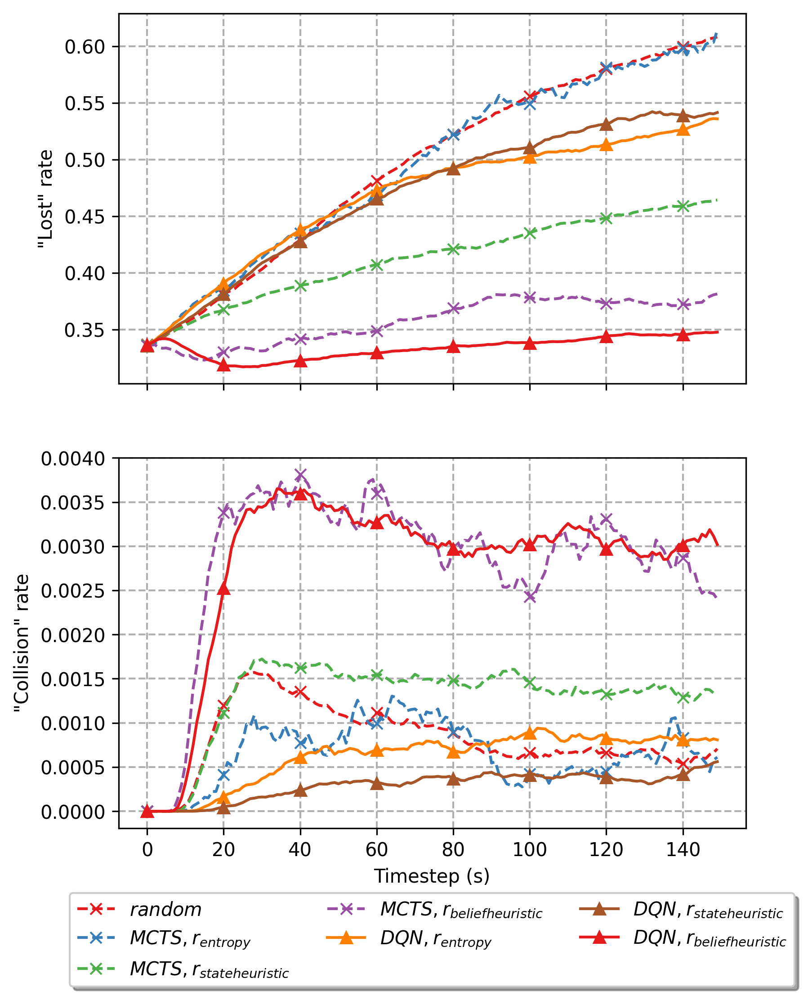

In [86]:

run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':8, 'likelihood':'weight2'}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

3
4
mcts =  2022-04-08T15:49:10
dqn =  2022-04-15T14:01:40
mcts =  2022-04-09T09:50:33
dqn =  2022-04-13T16:41:03
mcts =  2022-04-09T09:53:34
dqn =  2022-04-13T16:40:21
3
4
mcts =  2022-04-08T15:49:10
dqn =  2022-04-15T14:01:40
mcts =  2022-04-09T09:50:33
dqn =  2022-04-13T16:41:03
mcts =  2022-04-09T09:53:34
dqn =  2022-04-13T16:40:21


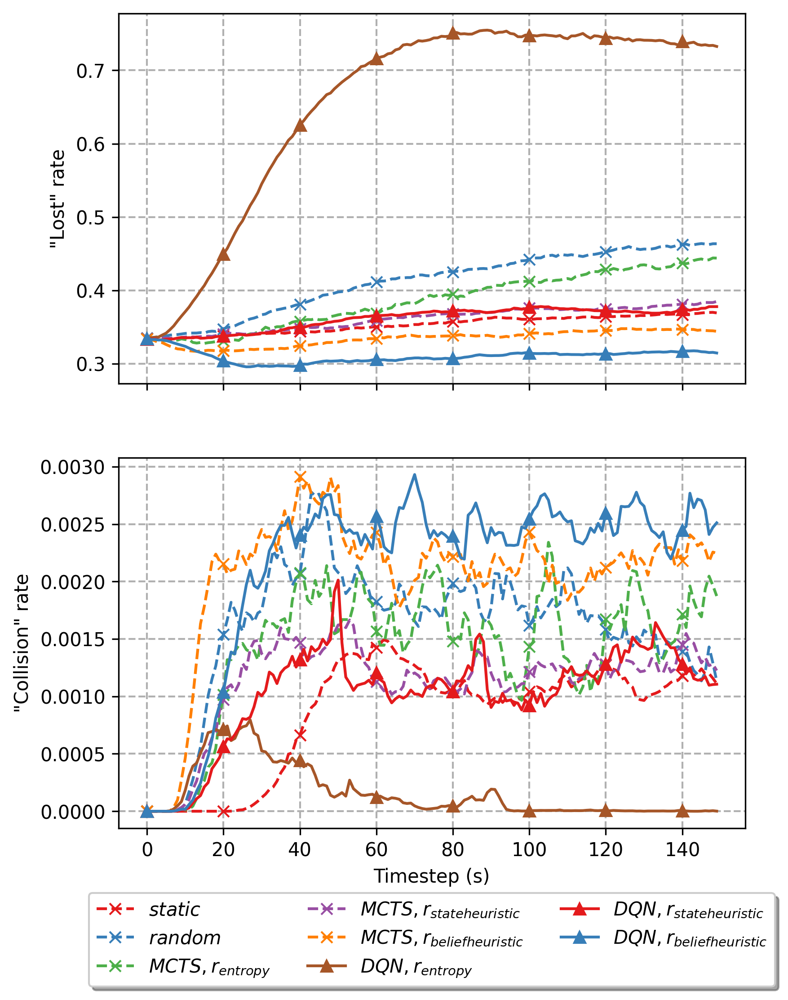

In [56]:
### FIGURE

run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':8, 'particle_diffuse':'True'}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

1
1
mcts =  2022-04-08T15:49:10
dqn =  2022-04-13T16:41:24
mcts =  2022-04-09T09:50:33
dqn =  2022-04-13T16:41:03
mcts =  2022-04-09T09:53:34
dqn =  2022-04-13T16:40:21
1
1
mcts =  2022-04-08T15:49:10
dqn =  2022-04-13T16:41:24
mcts =  2022-04-09T09:50:33
dqn =  2022-04-13T16:41:03
mcts =  2022-04-09T09:53:34
dqn =  2022-04-13T16:40:21


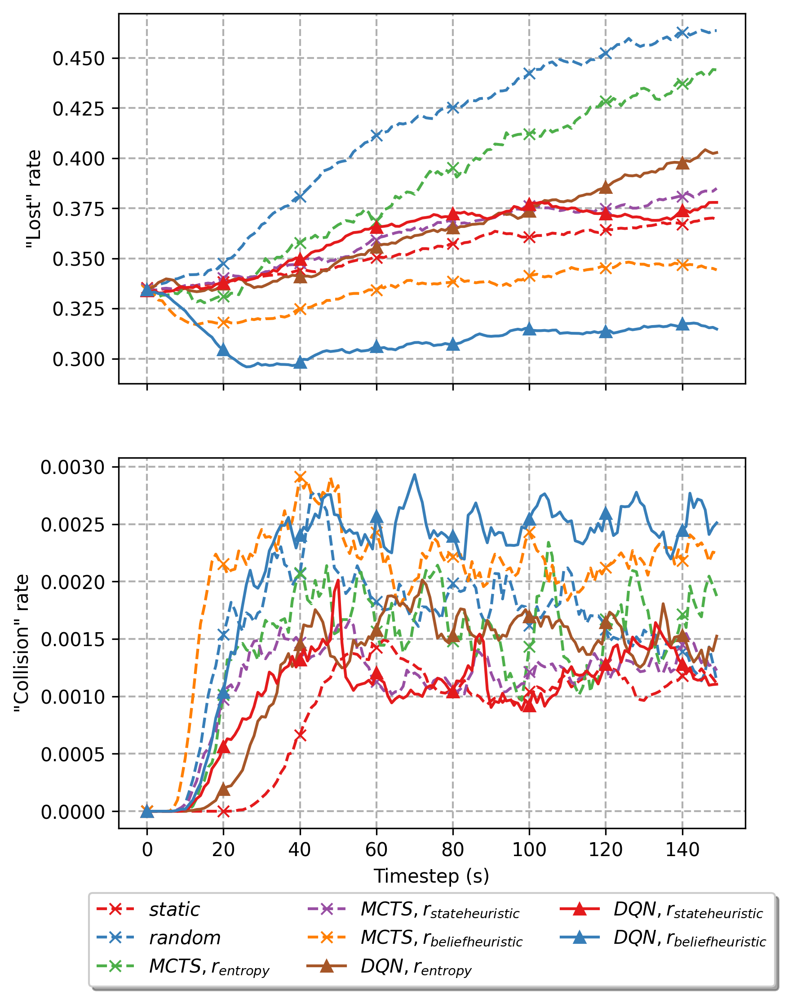

In [50]:
### FIGURE

run_filter = {'sensor': 'doublerssilofi', 'fading_sigma':8, 'particle_diffuse':'True', 'version':'final_weight'}
doublerssi_heuristic_metric_comparison(run_filter, cumulative=False )

In [ ]:
run_filter = {'sensor': 'doublerssi', 'fading_sigma':2, 'reward':'entropy_collision_reward' }
doublerssi_mean_counts_comparison(run_filter, 'lost', cumulative=False)
doublerssi_mean_counts_comparison(run_filter, 'collisions', cumulative=False)

In [ ]:
run_filter = {'sensor': 'doublerssi', 'fading_sigma':4, 'reward':'range_reward' }
mcts_runs = filter_runs('mcts', run_filter)
mcts_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
dqn_runs = filter_runs('dqn', run_filter)
dqn_runs.sort(key=lambda run_ts: datetime.strptime(run_ts, '%Y-%m-%dT%H:%M:%S'), reverse=True)
for i,r in enumerate(dqn_runs): 
    print('#{}'.format(i))
    #print(get_config('dqn', r))
    print('reward = ',get_config('dqn', r)['Methods'].get('reward'))
    print('fading_sigma = ',get_config('dqn', r)['Methods'].get('fading_sigma',0))
    doublerssi_mean_counts('dqn', r, 'lost')
    doublerssi_mean_counts('dqn', r, 'lost', cumulative=False)
    doublerssi_mean_counts('dqn', r, 'collisions')
    doublerssi_mean_counts('dqn', r, 'collisions', cumulative=False)
for i,r in enumerate(mcts_runs): 
    print('#{}'.format(i))
    #print(get_config('dqn', r))
    print('reward = ',get_config('mcts', r)['Methods'].get('reward'))
    print('fading_sigma = ',get_config('mcts', r)['Methods'].get('fading_sigma',0))
    doublerssi_mean_counts('mcts', r, 'lost')
    doublerssi_mean_counts('mcts', r, 'lost', cumulative=False)
    doublerssi_mean_counts('mcts', r, 'collisions')
    doublerssi_mean_counts('mcts', r, 'collisions', cumulative=False)

In [ ]:

config = get_config('mcts', runs[0])
data = get_data('mcts', runs[0])

print('Run: {}'.format(runs[0]))
print('\nConfig: ')
pprint.pprint(config)
print('\nLog metrics and state information:')
pprint.pprint(list(data.columns.values))
